# Predicting user's physical activity from Apple Watch and Fitbit data using Machine Learning 

by Rituparna Basu, March 2023

#### Context:
Commercial wearable devices are utilized by people for measuring various physical conditions from which the device also predicts  physical activity. Since users rely on these predictions and associated statistics, it is important that these predictions are as accurate as possible. The accuracy of these predcitions is of interest to the users and the manufacturers alike. Therefore a study was conducted under a controlled environment to collect reliable data and test machine learning predcitions of these activities by these devices. 

"We recruited a convenience sample of 46 participants (26 women) to wear three devices, a GENEActiv, and Apple Watch Series 2, a Fitbit Charge HR2. Participants completed a 65-minute protocol with 40-minutes of total treadmill time and 25-minutes of sitting or lying time. Indirect calorimetry was used to measure energy expenditure. The outcome variable for the study was the activity class; lying, sitting, walking self-paced, 3 METS, 5 METS, and 7 METS. Minute-by-minute heart rate, steps, distance, and calories from Apple Watch and Fitbit were included in four different machine learning models."- Fuller et al., 2020, "Replication Data for: Using machine learning methods to predict physical activity types with Apple Watch and Fitbit data using indirect calorimetry as the criterion.", https://doi.org/10.7910/DVN/ZS2Z2J, Harvard Dataverse, V1.

Details of each feature is provided below. 

#### Objective:
The obejective of this project is to perform explorartory data analysis, clean and correct, prepare the data, test various machine learning techniques, and select the best model based on the performance. Another critical product of this study will be to record the acuuracy of the predictions and which method improves the predictibility. 
 
This analysis will assist 
* to further improve the predictability
* to include more features and measurements by the devices in newer versions of the devices
* to understand the working principles and
* to market the devices more appropriately

In addition, this study will assist the users to understand the capability and limititations of the devices. It will also help the regulators to design new policies and protocols for market regulations.  

## Data Description

Detailed data dictionary is given below.

* age:
* gender:Female=0, Male=1
* height: in cm
* weight: in Kg 
* steps: Number of steps/minute
* heart_rate: Average heart rate/minute 
* calories: Energy Expenditure Amount of calories expended 
* distance: Distance ran in metres
* entropy_heart: Heart Rate Entropy Measure of heart rate variability.
* entropy_steps: Steps Entropy Measure of steps variability.
* resting_hearth: Resting Heart Rate 10th percentile of HR data.
* corr_heart_steps: Correlation coefficient between heart rate and steps
* intensity_karvonen: Intensity zone during activity 
* sd_norm_heart: Standard deviation of normalized heart rate
* steps_times_distance: Product measure of total amount of steps and distance covered in metres  (Steps*Distance)
* device: Apple Watch, Fitbit
* activity: 

## Importing libraries

In [1]:
# Set up environment

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.pandas.set_option('display.max_columns',None)
import datetime
from datetime import timedelta
import seaborn as sns
from scipy import stats

import os
import itertools
from itertools import product
from typing import Dict, List, Tuple, Union


from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,ConfusionMatrixDisplay


# Libtune to tune model, get different metric scores
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score


# To help with model building
from sklearn import ensemble
from sklearn.pipeline import Pipeline
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

#Set Style for Seaborn Plots
sns.set_style("darkgrid", {"axes.facecolor": ".9"})


# Library to suppress warnings or deprecation notes 
import warnings
warnings.filterwarnings('ignore')




## Loading Data

In [2]:
# Read in the data

df = pd.read_csv("aw_fb_data.csv")

In [3]:
#let's see feature size
df.shape

(6264, 20)

## Data Overview

- Observations
- Sanity checks

In [4]:
print(f'There are {df.shape[0]} rows and {df.shape[1]} columns.')  # f-string
df.head(5) 

There are 6264 rows and 20 columns.


,Unnamed: 0,X1,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,device,activity
0,1,1,20,1,168.0,65.4,10.771429,78.531302,0.344533,0.008327,6.221612,6.116349,59.0,1.000000,19.531302,0.138520,1.000000,0.089692,apple watch,Lying
1,2,2,20,1,168.0,65.4,11.475325,78.453390,3.287625,0.008896,6.221612,6.116349,59.0,1.000000,19.453390,0.137967,1.000000,0.102088,apple watch,Lying
2,3,3,20,1,168.0,65.4,12.179221,78.540825,9.484000,0.009466,6.221612,6.116349,59.0,1.000000,19.540825,0.138587,1.000000,0.115287,apple watch,Lying
3,4,4,20,1,168.0,65.4,12.883117,78.628260,10.154556,0.010035,6.221612,6.116349,59.0,1.000000,19.628260,0.139208,1.000000,0.129286,apple watch,Lying
4,5,5,20,1,168.0,65.4,13.587013,78.715695,10.825111,0.010605,6.221612,6.116349,59.0,0.982816,19.715695,0.139828,0.241567,0.144088,apple watch,Lying


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6264 entries, 0 to 6263
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            6264 non-null   int64  
 1   X1                    6264 non-null   int64  
 2   age                   6264 non-null   int64  
 3   gender                6264 non-null   int64  
 4   height                6264 non-null   float64
 5   weight                6264 non-null   float64
 6   steps                 6264 non-null   float64
 7   hear_rate             6264 non-null   float64
 8   calories              6264 non-null   float64
 9   distance              6264 non-null   float64
 10  entropy_heart         6264 non-null   float64
 11  entropy_setps         6264 non-null   float64
 12  resting_heart         6264 non-null   float64
 13  corr_heart_steps      6264 non-null   float64
 14  norm_heart            6264 non-null   float64
 15  intensity_karvonen   

## Data cleaning
* Check duplicate value
* Check missing value
* Drop unnecessary columns
* Check data type of all columns

In [6]:
duplicate = df[df.duplicated()]
# duplicate=df.duplicated(subset=None, keep='first')
duplicate

,Unnamed: 0,X1,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,device,activity


* There is no duplicated row.

In [7]:
df.describe()

,Unnamed: 0,X1,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance
count,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000,6264.000000
mean,3132.500000,1771.144317,29.158525,0.476533,169.709052,69.614464,109.562268,86.142331,19.471823,13.832555,6.030314,5.739984,65.869938,0.306447,20.272393,0.155479,8.110854,590.035239
std,1808.405375,1097.988748,8.908978,0.499489,10.324698,13.451878,222.797908,28.648385,27.309765,45.941437,0.765574,1.256348,21.203017,0.775418,28.388116,0.210927,12.535080,4063.838530
min,1.000000,1.000000,18.000000,0.000000,143.000000,43.000000,1.000000,2.222222,0.056269,0.000440,0.000000,0.000000,3.000000,-1.000000,-76.000000,-2.714286,0.000000,0.000690
25%,1566.750000,789.750000,23.000000,0.000000,160.000000,60.000000,5.159534,75.598079,0.735875,0.019135,6.108524,5.909440,58.134333,-0.467303,1.148883,0.009819,0.264722,0.659260
50%,3132.500000,1720.000000,28.000000,0.000000,168.000000,68.000000,10.092029,77.267680,4.000000,0.181719,6.189825,6.157197,75.000000,0.665829,9.820254,0.079529,2.893503,13.368619
75%,4698.250000,2759.250000,33.000000,1.000000,180.000000,77.300000,105.847222,95.669118,20.500000,15.697188,6.247928,6.247928,76.138701,1.000000,27.077336,0.211868,9.679672,93.728562
max,6264.000000,3670.000000,56.000000,1.000000,191.000000,115.000000,1714.000000,194.333333,97.500000,335.000000,6.475733,6.475733,155.000000,1.000000,156.319444,1.297980,74.457929,51520.000000


In [8]:
# Find the missing values for each variable.

df.isnull().sum().sort_values(ascending=False)

Unnamed: 0              0
X1                      0
device                  0
steps_times_distance    0
sd_norm_heart           0
intensity_karvonen      0
norm_heart              0
corr_heart_steps        0
resting_heart           0
entropy_setps           0
entropy_heart           0
distance                0
calories                0
hear_rate               0
steps                   0
weight                  0
height                  0
gender                  0
age                     0
activity                0
dtype: int64

* There is no null data

In [9]:
# Find Unique values

df.nunique()

Unnamed: 0              6264
X1                      3656
age                       24
gender                     2
height                    28
weight                    43
steps                   3919
hear_rate               4514
calories                2136
distance                4863
entropy_heart             56
entropy_setps             60
resting_heart             83
corr_heart_steps        2925
norm_heart              5033
intensity_karvonen      5841
sd_norm_heart           3435
steps_times_distance    4939
device                     2
activity                   6
dtype: int64

In [10]:
backup = df.copy()

In [11]:
df['activity'].value_counts()

Lying             1379
Running 7 METs    1114
Running 5 METs    1002
Running 3 METs     950
Sitting            930
Self Pace walk     889
Name: activity, dtype: int64

In [12]:
df['device'].value_counts()

apple watch    3656
fitbit         2608
Name: device, dtype: int64

In [13]:
df['gender'].value_counts()

0    3279
1    2985
Name: gender, dtype: int64

In [14]:
df1=df.copy()

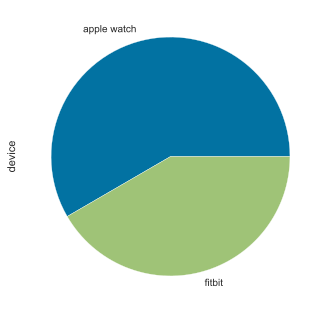

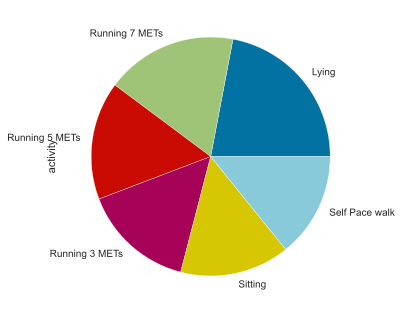

In [15]:
for col in df1.select_dtypes('object'):
    plt.figure()
    df1[col].value_counts().plot.pie()

* Various divisions of data were checked to find Apple Watch vs Fitbit, and the samples of various activities were comparable. Therefore, overall, the data is not biased in sampling and should represent all classes adequately. 

<AxesSubplot:xlabel='gender', ylabel='count'>

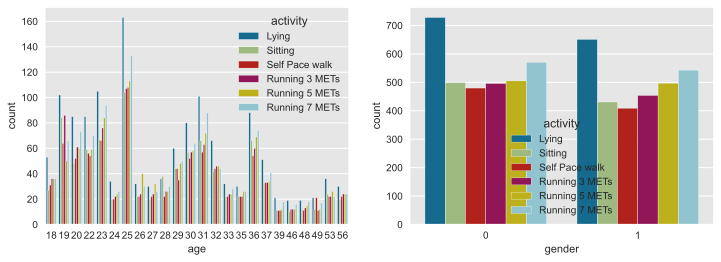

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
sns.countplot(ax=axs[0],x='age', hue='activity', data=df1)
sns.countplot(ax=axs[1],x='gender', hue='activity', data=df1)

* There are more younger samples than older ones.
* Gender-wise activities are also comparable. Male (1) samples are little lower than the female samples

In [17]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [18]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=45, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=8,
            xytext=(0, 3),
            textcoords="offset points",
        )  # annotate the percentage
        
    # Adjust the font size of the tick labels
        ax.tick_params(labelsize=8)
   

    plt.show()  # show the plot

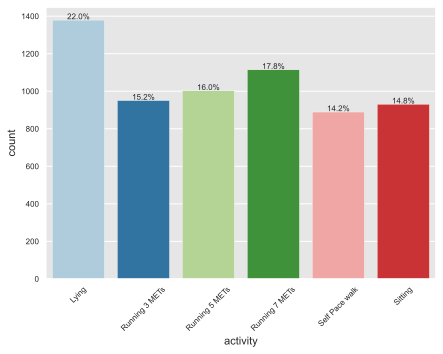

In [19]:
labeled_barplot(df1, "activity", perc=True)

<AxesSubplot:xlabel='device', ylabel='activity'>

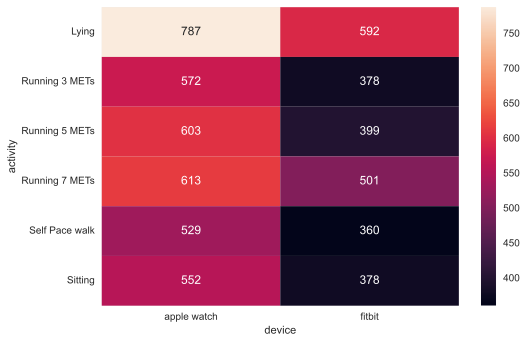

In [20]:
sns.heatmap(pd.crosstab(df1["activity"],df1["device"]),annot=True,fmt='d')

In [21]:
df1_plot=df1.copy()

In [22]:
df1_plot= df1_plot.drop(columns=['Unnamed: 0','X1','device','activity'])

In [23]:
df1_plot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6264 entries, 0 to 6263
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   6264 non-null   int64  
 1   gender                6264 non-null   int64  
 2   height                6264 non-null   float64
 3   weight                6264 non-null   float64
 4   steps                 6264 non-null   float64
 5   hear_rate             6264 non-null   float64
 6   calories              6264 non-null   float64
 7   distance              6264 non-null   float64
 8   entropy_heart         6264 non-null   float64
 9   entropy_setps         6264 non-null   float64
 10  resting_heart         6264 non-null   float64
 11  corr_heart_steps      6264 non-null   float64
 12  norm_heart            6264 non-null   float64
 13  intensity_karvonen    6264 non-null   float64
 14  sd_norm_heart         6264 non-null   float64
 15  steps_times_distance 

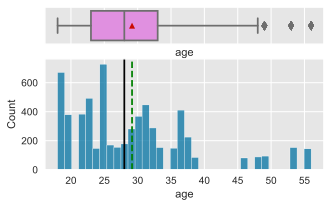

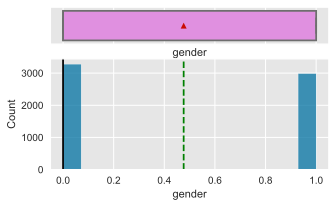

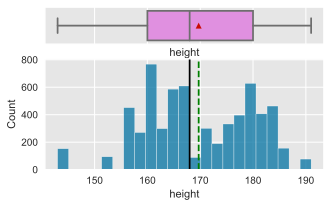

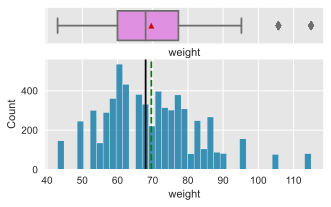

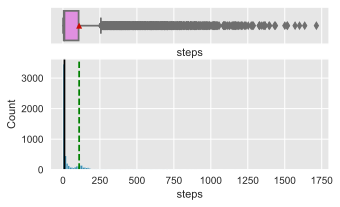

...

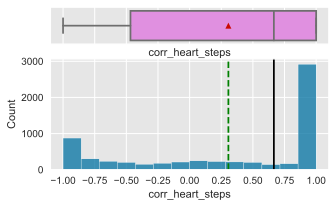

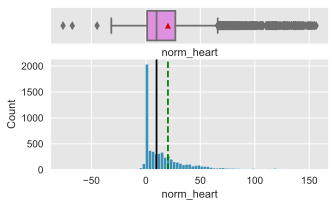

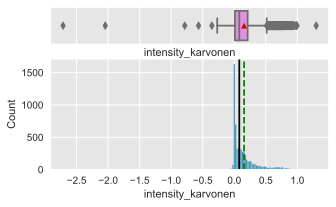

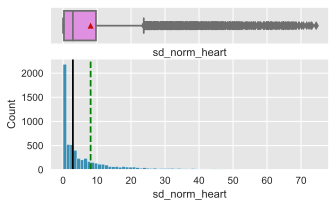

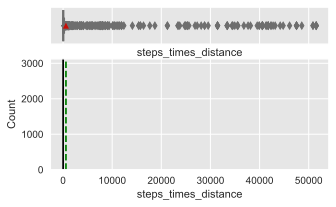

In [24]:
for feature in df1_plot.columns:
    histogram_boxplot(df1_plot, feature, figsize=(5, 3), kde=False, bins=None)

* Population sampled are generally normal to lower weight. Obese groups are missing from the sample.
* Looks like there are some resting heart rate data which is below normal values.
* Age range sampled is lower than 56 yrs that too focussed mainly between 18-40 yrs. However, a lot of older people use these wearable devices to monitor physiological conditions.
* There is no negative data, although, some outliers are there which can be physiologically extreme.
* It would be recommended to build automated data correction in the wearables. 



## Feature Engineering

In [25]:
# Calculate Bmi
df1['bmi'] = df1['weight']/(df1['height']**2) * 10_000 
df1['calories_bmi'] =df1['calories']/df1['bmi']

In [26]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6264 entries, 0 to 6263
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            6264 non-null   int64  
 1   X1                    6264 non-null   int64  
 2   age                   6264 non-null   int64  
 3   gender                6264 non-null   int64  
 4   height                6264 non-null   float64
 5   weight                6264 non-null   float64
 6   steps                 6264 non-null   float64
 7   hear_rate             6264 non-null   float64
 8   calories              6264 non-null   float64
 9   distance              6264 non-null   float64
 10  entropy_heart         6264 non-null   float64
 11  entropy_setps         6264 non-null   float64
 12  resting_heart         6264 non-null   float64
 13  corr_heart_steps      6264 non-null   float64
 14  norm_heart            6264 non-null   float64
 15  intensity_karvonen   

## EDA for Apple Watch

In [27]:
df1_aw = df1[df1['device']=='apple watch'].copy()
df1_aw.reset_index(drop=True,inplace=True)

In [28]:
# Drop columns.
df1_aw= df1_aw.drop(columns=['Unnamed: 0', 'X1','device'])

In [29]:
df1_aw.shape

(3656, 19)

array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'gender'}>,
        <AxesSubplot:title={'center':'height'}>,
        <AxesSubplot:title={'center':'weight'}>],
       [<AxesSubplot:title={'center':'steps'}>,
        <AxesSubplot:title={'center':'hear_rate'}>,
        <AxesSubplot:title={'center':'calories'}>,
        <AxesSubplot:title={'center':'distance'}>],
       [<AxesSubplot:title={'center':'entropy_heart'}>,
        <AxesSubplot:title={'center':'entropy_setps'}>,
        <AxesSubplot:title={'center':'resting_heart'}>,
        <AxesSubplot:title={'center':'corr_heart_steps'}>],
       [<AxesSubplot:title={'center':'norm_heart'}>,
        <AxesSubplot:title={'center':'intensity_karvonen'}>,
        <AxesSubplot:title={'center':'sd_norm_heart'}>,
        <AxesSubplot:title={'center':'steps_times_distance'}>],
       [<AxesSubplot:title={'center':'bmi'}>,
        <AxesSubplot:title={'center':'calories_bmi'}>, <AxesSubplot:>,
        <AxesSubplot:>]]

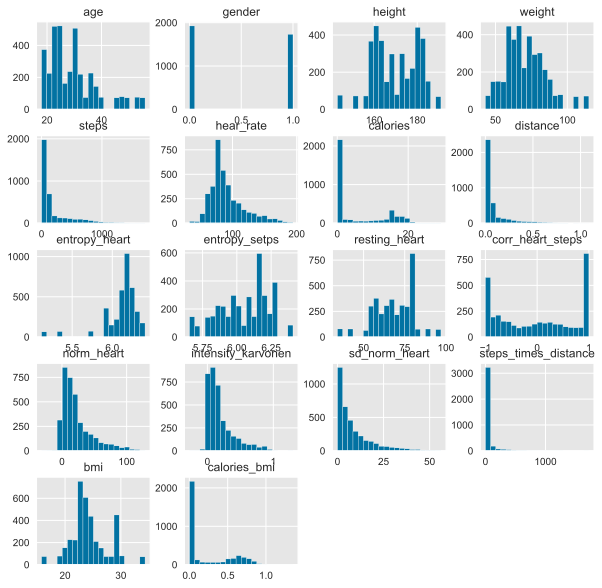

In [30]:
df1_aw.hist(bins=20, figsize=(10,10))

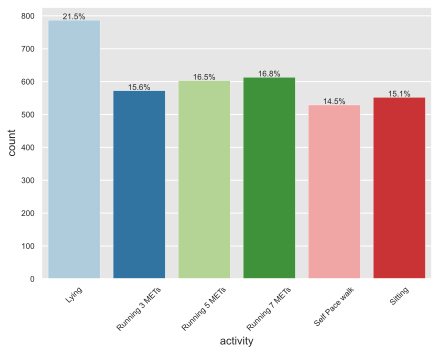

In [31]:
labeled_barplot(df1_aw, "activity", perc=True)

* There is no negative data, although, some outliers are there which can be physiologically extreme.

* It would be recommended to build automated data correction in the wearables. 


<AxesSubplot:>

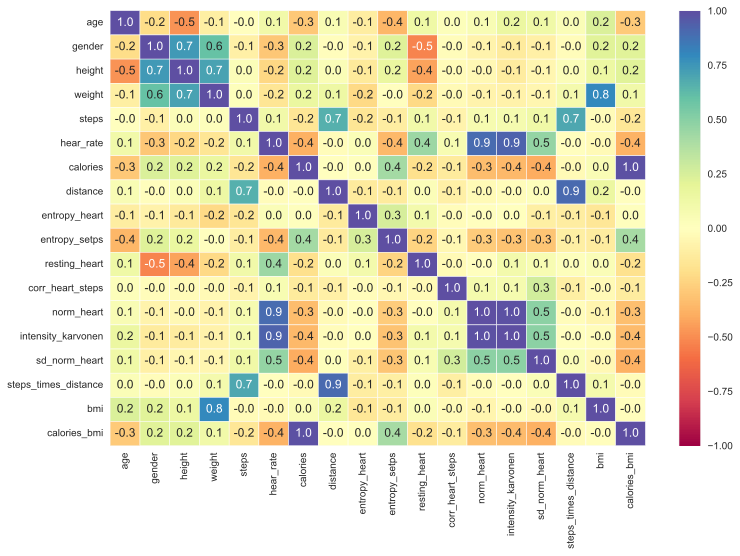

In [32]:
plt.figure(figsize = (12,8))
sns.heatmap(df1_aw.corr(),annot=True, center=0, linewidths=.5, fmt='.1f',vmin=-1, vmax=1, cmap="Spectral")

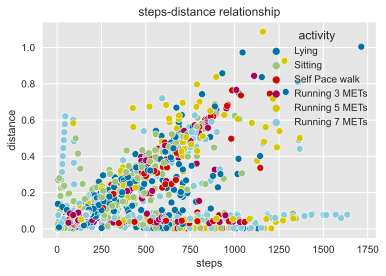

In [33]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'steps', y = 'distance', hue='activity')
plt.title('steps-distance relationship');

* Steps and Distance show a strong correlation 0.7 (which is expected)

* There are three trends, apparently indicating groups with different step lengths. 

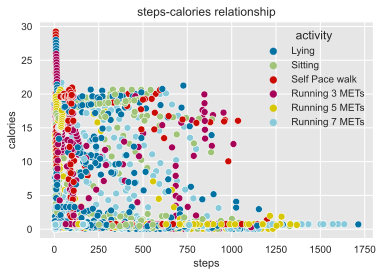

In [34]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'steps', y = 'calories', hue='activity')
plt.title('steps-calories relationship');

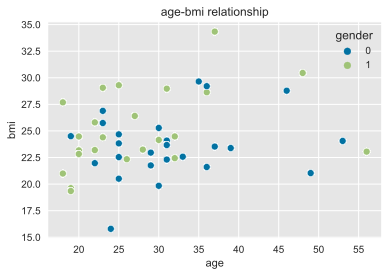

In [35]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'age', y = 'bmi', hue='gender') # female=0
plt.title('age-bmi relationship');

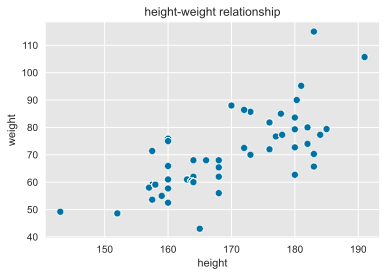

In [36]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'height', y = 'weight')
plt.title('height-weight relationship');

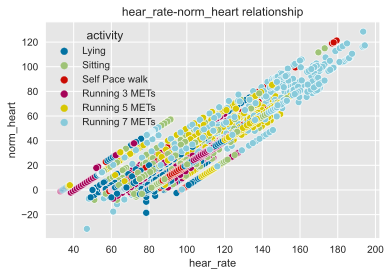

In [37]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'hear_rate', y = 'norm_heart', hue='activity')
plt.title('hear_rate-norm_heart relationship');

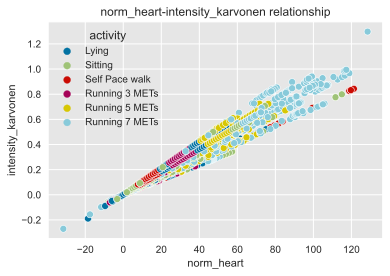

In [38]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'norm_heart', y = 'intensity_karvonen', hue='activity')
plt.title('norm_heart-intensity_karvonen relationship');

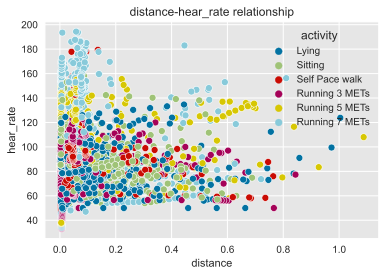

In [39]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'distance', y = 'hear_rate', hue='activity')
plt.title('distance-hear_rate relationship');

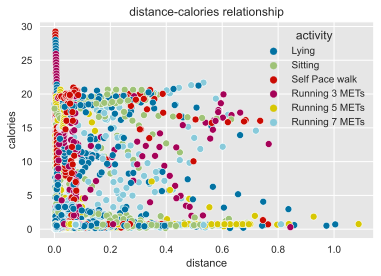

In [40]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_aw, x = 'distance', y = 'calories', hue='activity')
plt.title('distance-calories relationship');

* Although density of data is more toward the lower age group, i.e., there are very few data in the upper age group, BMI shows slightly increasing trend with increase in age.

* Weight steadily increases with height as expected.

* Intensity Kervonen is higher with heart rate and correlates well with the physical activity types.

* High intensity activities raises heart rate even at shorter distances.


# Data preparation for modeling

In [41]:
df2_aw= df1_aw.copy()

In [42]:
df2_aw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3656 entries, 0 to 3655
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   3656 non-null   int64  
 1   gender                3656 non-null   int64  
 2   height                3656 non-null   float64
 3   weight                3656 non-null   float64
 4   steps                 3656 non-null   float64
 5   hear_rate             3656 non-null   float64
 6   calories              3656 non-null   float64
 7   distance              3656 non-null   float64
 8   entropy_heart         3656 non-null   float64
 9   entropy_setps         3656 non-null   float64
 10  resting_heart         3656 non-null   float64
 11  corr_heart_steps      3656 non-null   float64
 12  norm_heart            3656 non-null   float64
 13  intensity_karvonen    3656 non-null   float64
 14  sd_norm_heart         3656 non-null   float64
 15  steps_times_distance 

### Now, first split data into feature set and target (X,y)

In [43]:
# `y` is the target variable (what you are trying to predict)
y = df2_aw['activity']

# `X` is the feature set that you are using to predict
X = df2_aw.drop(['activity'],axis=1)  # keeping only independent features in the X matrix

In [44]:
print(f'There are {df2_aw.shape[0]} rows and {df2_aw.shape[1]} columns in the dataset df2_aw.')
print(f'There are {X.shape[0]} rows and {X.shape[1]} columns in the dataset X, i.e., the independent variables.')


There are 3656 rows and 19 columns in the dataset df2_aw.
There are 3656 rows and 18 columns in the dataset X, i.e., the independent variables.


###  Now lets split the data into train and test sets where 30% of the data resides in the test set.

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

print(X_train.shape, X_test.shape)

(2559, 18) (1097, 18)


In [46]:
# describes info about train and test set
print("X_train dataset: ", X_train.shape)
print("y_train dataset: ", y_train.shape)
print("X_test dataset: ", X_test.shape)
print("y_test dataset: ", y_test.shape)

X_train dataset:  (2559, 18)
y_train dataset:  (2559,)
X_test dataset:  (1097, 18)
y_test dataset:  (1097,)


In [47]:
# Lets check the target again
print(y.value_counts())
print("")
print(y.value_counts(1))

Lying             787
Running 7 METs    613
Running 5 METs    603
Running 3 METs    572
Sitting           552
Self Pace walk    529
Name: activity, dtype: int64

Lying             0.215263
Running 7 METs    0.167670
Running 5 METs    0.164934
Running 3 METs    0.156455
Sitting           0.150985
Self Pace walk    0.144694
Name: activity, dtype: float64


In [48]:
print(y_test.value_counts())
y_test.value_counts(1)

Lying             252
Running 7 METs    186
Running 5 METs    177
Running 3 METs    176
Self Pace walk    153
Sitting           153
Name: activity, dtype: int64


Lying             0.229717
Running 7 METs    0.169553
Running 5 METs    0.161349
Running 3 METs    0.160438
Self Pace walk    0.139471
Sitting           0.139471
Name: activity, dtype: float64

# Build Models
**Performance measures of the models**
* We will use Accuracy, Recall, Precision and F1 score, in addition to the confusion matrix to evaluate the models.
    * Accuracy - Accuracy is the percentage of correct classifications that a ML model achieves. Accuracy = TP+TN/(TP+TN+FP+FN)
    * Recall (Sensitivity) - Recall is the ratio of correctly predicted positive observations to the all observations in actual class certified, i.e., how many did we predict? Recall = TP/TP+FN
    * Precision is the ratio of correctly predicted positive observations to the total predicted positive observations, i.e., of all the cases that we predicted, how many were actually 1?. Precision = TP/TP+FP
    * F1 Score is the weighted average of Precision and Recall. Therefore, this considers both false positives and false negatives as well. F1 Score = 2*(Recall * Precision) / (Recall + Precision)

* Precision: Indicates how many classes are correctly classified
* Recall: Indicates what proportions of actual positives was identified correctly
* F-Score: It is the harmonic mean between precision & recall
* Support: It is the number of occurrence of the given class in our dataset

** The most critical assumption in all analysis and modeling prediction is that the past data represents how the future cases will behave.
**We will choose our model also based on NOT/LOW overfitting of the training data** 


### Confusion Matrix
Confusion matrix helps to visualize the performance of the model

* The elements along the diagonal represents how many samples for the predicted label is same as the true label
* Elements off the diagonal represent samples that are misidentified by the classifier.
* The higher the values along the diagonal in a confusion matrix the better is the predictability of the model.

## Build Models for Apple Watch 

## 1.0a. Logistic Regression model

In [49]:
lr = LogisticRegression(multi_class='multinomial', solver='lbfgs')
lr.fit(X_train, y_train)

print('accuracy score: %s' % lr.score(X_test, y_test))
print('# of iterations %s' % lr.n_iter_[0])

accuracy score: 0.3154056517775752
# of iterations 100


In [50]:
lr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'multinomial',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.3008    0.5925    0.3990       535
Running 3 METs     0.2515    0.2096    0.2287       396
Running 5 METs     0.2881    0.2042    0.2390       426
Running 7 METs     0.4759    0.5082    0.4915       427
Self Pace walk     0.2468    0.1543    0.1899       376
       Sitting     0.1923    0.0877    0.1205       399

      accuracy                         0.3114      2559
     macro avg     0.2926    0.2928    0.2781      2559
  weighted avg     0.2954    0.3114    0.2873      2559


Confusion Matrix:
[[317  75  37  20  50  36]
 [131  83  81  19  52  30]
 [136  32  87 122  34  15]
 [120   8  49 217   7  26]
 [130 101  25  22  58  40]
 [220  31  23  56  34  35]]

AxesSubplot(0.125,0.125;0.281818x0.755)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.3407    0.5476    0.4201       252
Running 3 METs    

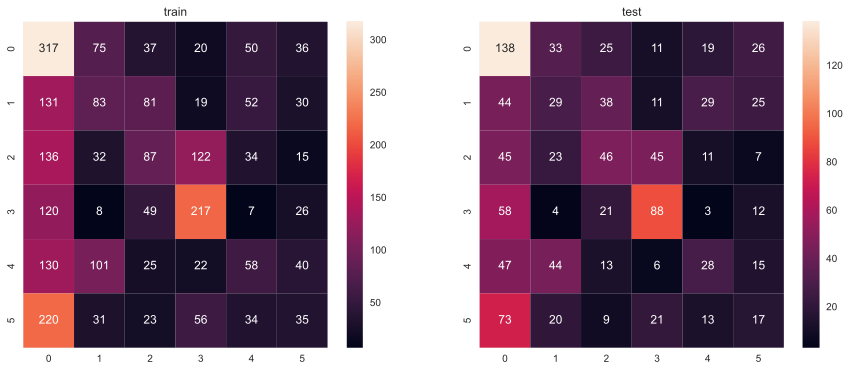

In [51]:
def print_score(lr, X_train, y_train, X_test, y_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
y_train_pred = lr.predict(X_train)

# Evaluation
print(f'Classification Report:\n{classification_report(y_train, y_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_train, y_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
y_test_pred = lr.predict(X_test)

# Evaluation
print(f'Classification Report:\n{classification_report(y_test, y_test_pred, digits = 4)}\n')

# print(f'ROC AUC Score: {roc_auc_score(y_test, y_test_pred)}\n')

print(f'Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [52]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'lr_report0'
lr_report0=classification_report(y_train, y_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'lr_train_perf'
lr_train_perf={'accuracy': lr_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=lr_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
lr_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_lr_train_perf = pd.Series(lr_train_perf)
print(s_lr_train_perf)

accuracy        0.311450
precision       0.295412
recall          0.311450
f1-score        0.287282
support      2559.000000
dtype: float64


In [53]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'lr_report'
lr_report=classification_report(y_test, y_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'lr_test_perf'
lr_test_perf={'accuracy': lr_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=lr_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
lr_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_lr_test_perf = pd.Series(lr_test_perf)
print(s_lr_test_perf)

accuracy        0.315406
precision       0.300655
recall          0.315406
f1-score        0.300101
support      1097.000000
dtype: float64


* Logistic regression is performing poorly on both training and testing data.

* The Accuracy is low (~31%) and so is the Recall and Precision.


## 2.0a. Random Forest

In [54]:
# parameters = {'clf__criterion':['entropy','gini'] , 'clf__max_depth':[80,100] , 'clf__n_estimators':[100,120],"clf__max_features":['sqrt', 'log2']}

rf = RandomForestClassifier(random_state = 42)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [55]:
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     1.0000    1.0000    1.0000       535
Running 3 METs     1.0000    1.0000    1.0000       396
Running 5 METs     1.0000    1.0000    1.0000       426
Running 7 METs     1.0000    1.0000    1.0000       427
Self Pace walk     1.0000    1.0000    1.0000       376
       Sitting     1.0000    1.0000    1.0000       399

      accuracy                         1.0000      2559
     macro avg     1.0000    1.0000    1.0000      2559
  weighted avg     1.0000    1.0000    1.0000      2559


Confusion Matrix:
[[535   0   0   0   0   0]
 [  0 396   0   0   0   0]
 [  0   0 426   0   0   0]
 [  0   0   0 427   0   0]
 [  0   0   0   0 376   0]
 [  0   0   0   0   0 399]]

AxesSubplot(0.125,0.125;0.281818x0.755)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8509    0.7698    0.8083       252
Running 3 METs    

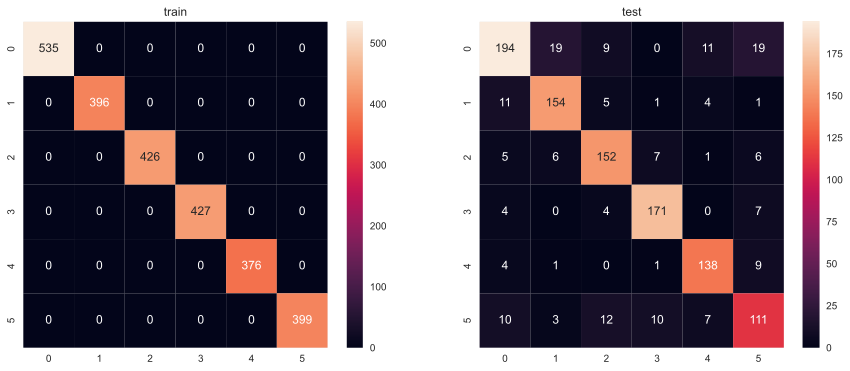

In [56]:
def print_score(rf, X_train, y_train, X_test, y_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
y_train_pred = rf.predict(X_train)

# Evaluation
print(f'Classification Report:\n{classification_report(y_train, y_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_train, y_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
y_test_pred = rf.predict(X_test)

# Evaluation
print(f'Classification Report:\n{classification_report(y_test, y_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [57]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'rf_report0'
rf_report0=classification_report(y_train, y_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'rf_train_perf'
rf_train_perf={'accuracy': rf_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=rf_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
rf_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_rf_train_perf = pd.Series(rf_train_perf)
print(s_rf_train_perf)

accuracy        1.0
precision       1.0
recall          1.0
f1-score        1.0
support      2559.0
dtype: float64


In [58]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'rf_report'
rf_report=classification_report(y_test, y_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'rf_test_perf'
rf_test_perf={'accuracy': rf_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=rf_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
rf_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_rf_test_perf = pd.Series(rf_test_perf)
print(s_rf_test_perf)

accuracy        0.838651
precision       0.838557
recall          0.838651
f1-score        0.837963
support      1097.000000
dtype: float64


* Random Forest is performing decently with high values along the diagonal, and high accuracy and precision. 
* Training performance is 1 in all metrics while the resting performance is very good in 0.83 in all metrics.
* This indicates that the model is  overfitting the training data.


## 3.0a. KNN

In [59]:
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [60]:
knn.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.6781    0.7757    0.7236       535
Running 3 METs     0.7577    0.8056    0.7809       396
Running 5 METs     0.7767    0.7676    0.7721       426
Running 7 METs     0.8258    0.7658    0.7947       427
Self Pace walk     0.7778    0.8191    0.7979       376
       Sitting     0.6997    0.5489    0.6152       399

      accuracy                         0.7483      2559
     macro avg     0.7526    0.7471    0.7474      2559
  weighted avg     0.7495    0.7483    0.7464      2559


Confusion Matrix:
[[415  31  12  14  22  41]
 [ 37 319   7   3  19  11]
 [ 31  23 327  14  12  19]
 [ 31  10  41 327   6  12]
 [ 25  19   3  10 308  11]
 [ 73  19  31  28  29 219]]

AxesSubplot(0.125,0.125;0.281818x0.755)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.5609    0.6032    0.5813       252
Running 3 METs    

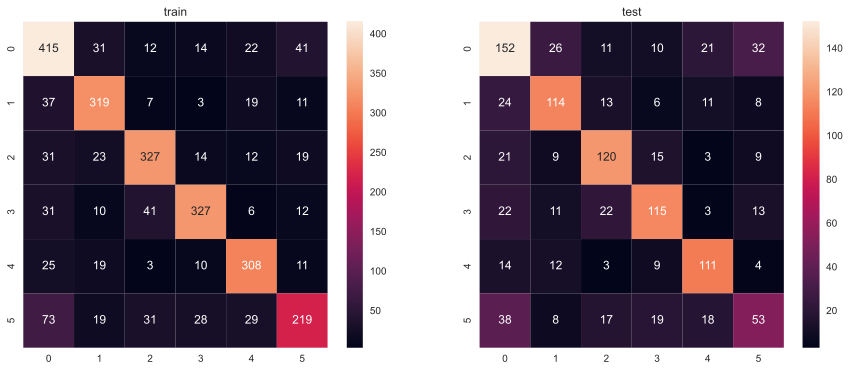

In [61]:
def print_score(knn, X_train, y_train, X_test, y_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
y_train_pred = knn.predict(X_train)

# Evaluation
print(f'Classification Report:\n{classification_report(y_train, y_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_train, y_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
y_test_pred = knn.predict(X_test)

# Evaluation
print(f'Classification Report:\n{classification_report(y_test, y_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [62]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'knn_report0'
knn_report0=classification_report(y_train, y_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knn_train_perf'
knn_train_perf={'accuracy': knn_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knn_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knn_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knn_train_perf = pd.Series(knn_train_perf)
print(s_knn_train_perf)

accuracy        0.748339
precision       0.749489
recall          0.748339
f1-score        0.746424
support      2559.000000
dtype: float64


In [63]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'knn_report'
knn_report=classification_report(y_test, y_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knn_test_perf'
knn_test_perf={'accuracy': knn_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knn_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knn_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knn_test_perf = pd.Series(knn_test_perf)
print(s_knn_test_perf)

accuracy        0.606199
precision       0.601433
recall          0.606199
f1-score        0.602392
support      1097.000000
dtype: float64


## 3.1a Tuning KNN model

In [64]:
knnt=KNeighborsClassifier()

In [65]:
#List of Hyperparameters to be tested
leaf_size = list(range(10,50,5))
n_neighbors = list(range(3,15,1))
p=[1,2]

In [66]:
#Make it into a dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)

In [67]:
#cv is cross validation
clf = GridSearchCV(knnt, hyperparameters, cv=10)

In [68]:
best_model = clf.fit(X_train,y_train)

In [69]:
# best hyperpaameters values
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 10
Best p: 1
Best n_neighbors: 3


In [70]:
y_test_pred = best_model.predict(X_test)

In [71]:
print(classification_report(y_test, y_test_pred))

                precision    recall  f1-score   support

         Lying       0.61      0.70      0.65       252
Running 3 METs       0.71      0.73      0.72       176
Running 5 METs       0.71      0.79      0.74       177
Running 7 METs       0.80      0.67      0.73       186
Self Pace walk       0.78      0.81      0.79       153
       Sitting       0.57      0.42      0.49       153

      accuracy                           0.69      1097
     macro avg       0.69      0.69      0.69      1097
  weighted avg       0.69      0.69      0.69      1097



Confusion Matrix:
[[176  22   6   8  15  25]
 [ 24 129   9   2  10   2]
 [ 13  10 139   9   2   4]
 [ 22   4  23 125   1  11]
 [ 13   7   1   0 124   8]
 [ 39  10  19  12   8  65]]

AxesSubplot(0.125,0.125;0.62x0.755)





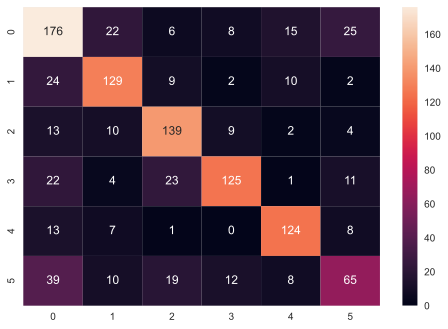

In [72]:
print(f'Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="g"))

print('\n\n')


In [73]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'knnt_report0'
knnt_report0=classification_report(y_train, y_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knnt_train_perf'
knnt_train_perf={'accuracy': knnt_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knnt_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knnt_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knnt_train_perf = pd.Series(knnt_train_perf)
print(s_knnt_train_perf)

accuracy        0.748339
precision       0.749489
recall          0.748339
f1-score        0.746424
support      2559.000000
dtype: float64


In [74]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'knnt_report'
knnt_report=classification_report(y_test, y_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knnt_test_perf'
knnt_test_perf={'accuracy': knnt_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knnt_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knnt_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knnt_test_perf = pd.Series(knnt_test_perf)
print(s_knnt_test_perf)

accuracy        0.690975
precision       0.691216
recall          0.690975
f1-score        0.687680
support      1097.000000
dtype: float64


* KNN is performing with 61% accuracy which is much lower than Random Forest (83% accuracy). 

* KNN is also slightly overfitting training data as the metrics show higher values for the Training performance.

* The metrics improved in the tuned KNN model where Leaf size, number of neighbors and p value ranges were tested through grid search CV. However, the tuned model is also highly overfitting the training data. 


## 4.0a. Gradient Boosting Classifier

In [75]:
#Fitting the model
gb = GradientBoostingClassifier(random_state=1)
gb.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

In [76]:
gb.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 1,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8887    0.8953    0.8920       535
Running 3 METs     0.8958    0.9116    0.9036       396
Running 5 METs     0.8975    0.9249    0.9110       426
Running 7 METs     0.9489    0.9133    0.9308       427
Self Pace walk     0.9021    0.9069    0.9045       376
       Sitting     0.8535    0.8321    0.8426       399

      accuracy                         0.8976      2559
     macro avg     0.8977    0.8974    0.8974      2559
  weighted avg     0.8978    0.8976    0.8976      2559


Confusion Matrix:
[[479  19   5   3  13  16]
 [  9 361   7   1  12   6]
 [  8   5 394   6   4   9]
 [ 13   2   8 390   2  12]
 [  4   7  10   0 341  14]
 [ 26   9  15  11   6 332]]

AxesSubplot(0.125,0.125;0.281818x0.755)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.7380    0.6706    0.7027       252
Running 3 METs    

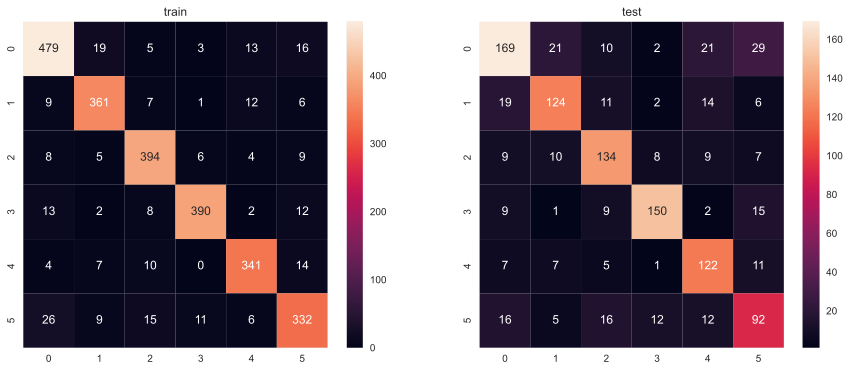

In [77]:
def print_score(gb, X_train, y_train, X_test, y_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
y_train_pred = gb.predict(X_train)

# Evaluation
print(f'Classification Report:\n{classification_report(y_train, y_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_train, y_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
y_test_pred = gb.predict(X_test)

# Evaluation
print(f'Classification Report:\n{classification_report(y_test, y_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [78]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'gb_report0'
gb_report0=classification_report(y_train, y_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gb_train_perf'
gb_train_perf={'accuracy': gb_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gb_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gb_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gb_train_perf = pd.Series(gb_train_perf)
print(s_gb_train_perf)

accuracy        0.897616
precision       0.897781
recall          0.897616
f1-score        0.897572
support      2559.000000
dtype: float64


In [79]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'gb_report'
gb_report=classification_report(y_test, y_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gb_test_perf'
gb_test_perf={'accuracy': gb_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gb_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gb_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gb_test_perf = pd.Series(gb_test_perf)
print(s_gb_test_perf)

accuracy        0.721057
precision       0.724875
recall          0.721057
f1-score        0.721627
support      1097.000000
dtype: float64


## 4.1a Tuning Gradient Boost

In [80]:
# To be used for tuning the model
from sklearn.model_selection import RandomizedSearchCV

In [81]:
%%time

# defining model 
model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV
param_grid = { "n_estimators": np.arange(50,200), 
              "learning_rate": [0.3, 0.1, 0.07], 
              "max_depth":[10, 5, 3], 
              "max_features":['sqrt']}

#Calling RandomizedSearchCV
gbt = RandomizedSearchCV(estimator=model, param_distributions=param_grid, scoring='accuracy', cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
gbt.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(gbt.best_params_, gbt.best_score_))

Best parameters are {'n_estimators': 110, 'max_features': 'sqrt', 'max_depth': 10, 'learning_rate': 0.07} with CV score=0.8139829990215265:
CPU times: total: 4min 51s
Wall time: 4min 54s


In [82]:
gbt = GradientBoostingClassifier(
    random_state=1,
    n_estimators=135,
    max_features='sqrt',
    max_depth=5,
    learning_rate=0.3,
          
)
# Fit the model on training data
gbt.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.3, max_depth=5, max_features='sqrt',
                           n_estimators=135, random_state=1)

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     1.0000    1.0000    1.0000       535
Running 3 METs     1.0000    1.0000    1.0000       396
Running 5 METs     1.0000    1.0000    1.0000       426
Running 7 METs     1.0000    1.0000    1.0000       427
Self Pace walk     1.0000    1.0000    1.0000       376
       Sitting     1.0000    1.0000    1.0000       399

      accuracy                         1.0000      2559
     macro avg     1.0000    1.0000    1.0000      2559
  weighted avg     1.0000    1.0000    1.0000      2559


Confusion Matrix:
[[535   0   0   0   0   0]
 [  0 396   0   0   0   0]
 [  0   0 426   0   0   0]
 [  0   0   0 427   0   0]
 [  0   0   0   0 376   0]
 [  0   0   0   0   0 399]]

AxesSubplot(0.125,0.125;0.281818x0.755)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8383    0.7817    0.8090       252
Running 3 METs    

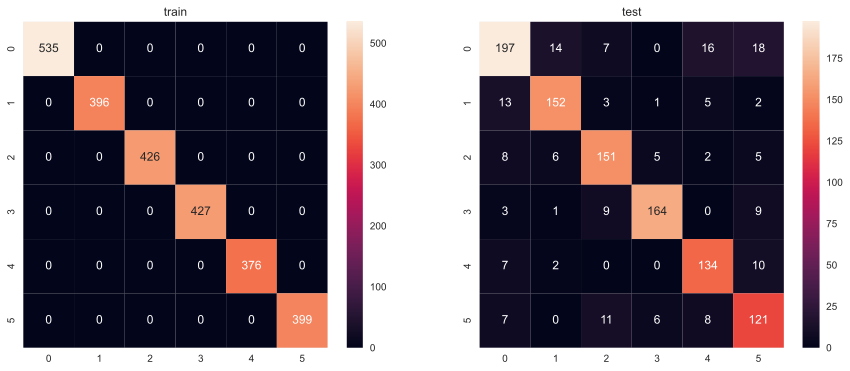

In [83]:
def print_score(gbt, X_train, y_train, X_test, y_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
y_train_pred = gbt.predict(X_train)

# Evaluation
print(f'Classification Report:\n{classification_report(y_train, y_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_train, y_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(y_train, y_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
y_test_pred = gbt.predict(X_test)

# Evaluation
print(f'Classification Report:\n{classification_report(y_test, y_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(y_test, y_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')


In [84]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'gbt_report0'
gbt_report0=classification_report(y_train, y_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gbt_train_perf'
gbt_train_perf={'accuracy': gbt_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gbt_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gbt_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gbt_train_perf = pd.Series(gbt_train_perf)
print(s_gbt_train_perf)

accuracy        1.0
precision       1.0
recall          1.0
f1-score        1.0
support      2559.0
dtype: float64


In [85]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'gbt_report'
gbt_report=classification_report(y_test, y_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gbt_test_perf'
gbt_test_perf={'accuracy': gbt_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gbt_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gbt_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gbt_test_perf = pd.Series(gbt_test_perf)
print(s_gbt_test_perf)

accuracy        0.837739
precision       0.840069
recall          0.837739
f1-score        0.838223
support      1097.000000
dtype: float64


* Gradient Boost (GB) model performing quite well on both train and test datasets.
* GB is slightly overfitting because training performance is better than the test performance.
* Tuned model shows perfect training performance and much improved testing performance compared to previous gradient boost. Therefore, the tuned GB model is relatively overfitting than the GB model.

## Model Performance Comparison and Conclusions

In [86]:
models_train_comp_df = pd.concat(
    [s_lr_train_perf.T,
     s_rf_train_perf.T,
     s_knn_train_perf.T,
     s_knnt_train_perf.T,
     s_gb_train_perf.T, 
     s_gbt_train_perf.T
    ],
    axis=1,
)  
models_train_comp_df.columns = [
    "Logistic Regression",
    "Random Forest",
    "KNN",
    "KNN Tuned",
    "Gradient Boost",
    "Gradient Boost Tuned",
    ]
models_train_comp_df= models_train_comp_df.drop(['support'])
print("Training performance comparison:")
models_train_comp_df   

Training performance comparison:


,Logistic Regression,Random Forest,KNN,KNN Tuned,Gradient Boost,Gradient Boost Tuned
accuracy,0.311450,1.0,0.748339,0.748339,0.897616,1.0
precision,0.295412,1.0,0.749489,0.749489,0.897781,1.0
recall,0.311450,1.0,0.748339,0.748339,0.897616,1.0
f1-score,0.287282,1.0,0.746424,0.746424,0.897572,1.0


In [87]:
models_test_comp_df = pd.concat(
    [s_lr_test_perf.T,
     s_rf_test_perf.T,
     s_knn_test_perf.T,
     s_knnt_test_perf.T,
     s_gb_test_perf.T, 
     s_gbt_test_perf.T
    ],
    axis=1,
)  
models_test_comp_df.columns = [
    "Logistic Regression",
    "Random Forest",
    "KNN",
    "KNN Tuned",
    "Gradient Boost",
    "Gradient Boost Tuned",
    ]
models_test_comp_df= models_test_comp_df.drop(['support'])
print("Testing performance comparison:")
models_test_comp_df   

Testing performance comparison:


,Logistic Regression,Random Forest,KNN,KNN Tuned,Gradient Boost,Gradient Boost Tuned
accuracy,0.315406,0.838651,0.606199,0.690975,0.721057,0.837739
precision,0.300655,0.838557,0.601433,0.691216,0.724875,0.840069
recall,0.315406,0.838651,0.606199,0.690975,0.721057,0.837739
f1-score,0.300101,0.837963,0.602392,0.687680,0.721627,0.838223


### Model selection:
* Performances were checked with various parameters:
     Reduced overfitting of training data over testing data
     Highest performance metrics, and also the confusion matrices. 
* Highest emphasis was placed on the Recall as the identification of the certified cases (i.e., 1) is of prime importance.

**Random Forest and the Gradient Boost Tuned model  both show perfect training performances and very good testing performance compared to other models.** 
* Therefore, both Random Forest and Gradient Boost Tuned are appropriate for this application.
* It also shows that for this kind of application, the physical activity prediction on the Apple Watch data is effective
* The accuracy of these two types of models are both close to 84%.


FEATURE IMPORTANCE OF RANDOM FOREST MODEL


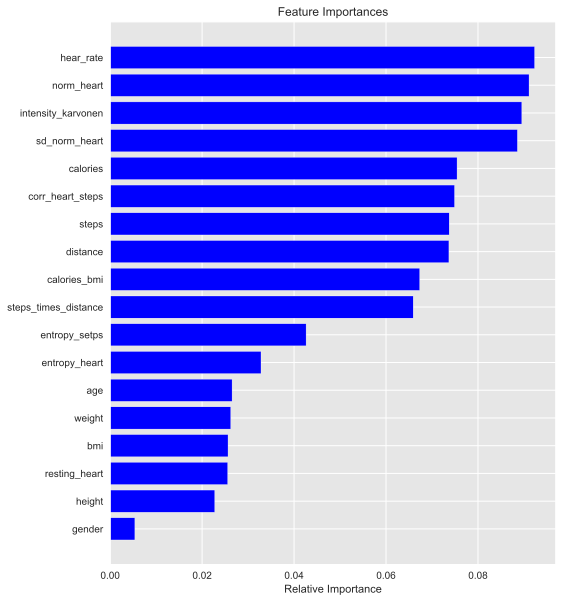

In [88]:
# For Random Forest

print('FEATURE IMPORTANCE OF RANDOM FOREST MODEL')

features = X_train.columns
importances = rf.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="Blue", align="center")
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

**Highest feature Importance are the ones with heart rate variables.**

FEATURE IMPORTANCE OF GRADIENT BOOST TUNED MODEL


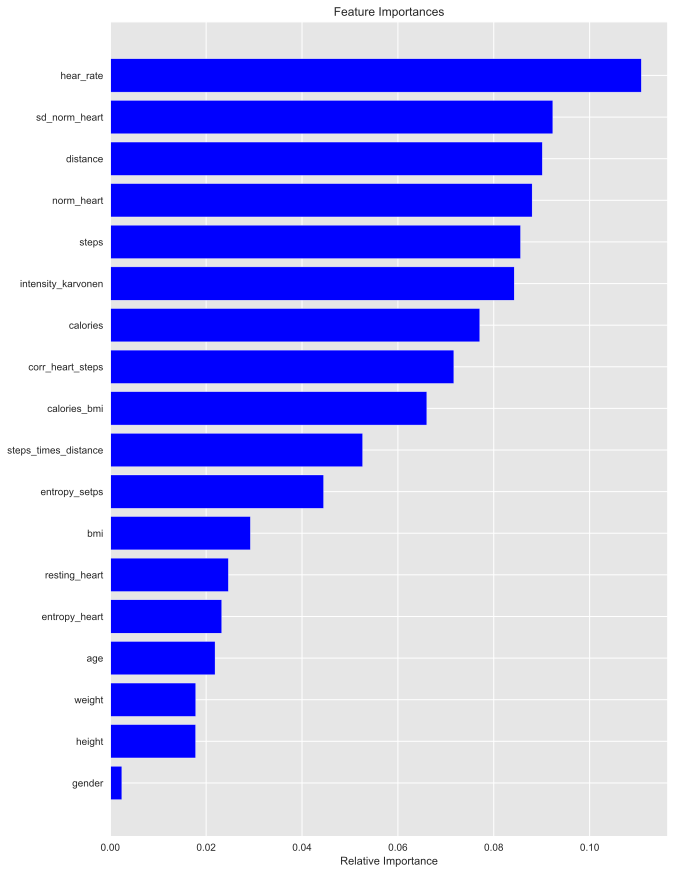

In [89]:
# For Gradient Boosting tuned

print('FEATURE IMPORTANCE OF GRADIENT BOOST TUNED MODEL')

features = X_train.columns
importances = gbt.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 15))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="Blue", align="center")
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

**Gradient Boosting also shows highest feature importance are the ones with heart rate variables.**

# Unsupervised Learning

In [90]:
df0_aw = df2_aw.copy()

In [91]:
df0_aw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3656 entries, 0 to 3655
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   3656 non-null   int64  
 1   gender                3656 non-null   int64  
 2   height                3656 non-null   float64
 3   weight                3656 non-null   float64
 4   steps                 3656 non-null   float64
 5   hear_rate             3656 non-null   float64
 6   calories              3656 non-null   float64
 7   distance              3656 non-null   float64
 8   entropy_heart         3656 non-null   float64
 9   entropy_setps         3656 non-null   float64
 10  resting_heart         3656 non-null   float64
 11  corr_heart_steps      3656 non-null   float64
 12  norm_heart            3656 non-null   float64
 13  intensity_karvonen    3656 non-null   float64
 14  sd_norm_heart         3656 non-null   float64
 15  steps_times_distance 

In [92]:
# Encoded activity in numbers in order
df0_aw["activity"] = df0_aw["activity"].replace({"Lying": 0, "Running 7 METs": 1, "Running 5 METs": 2, "Running 3 METs": 3, "Sitting": 4, "Self Pace walk": 5})

In [93]:
#Scaling
scaler=StandardScaler()
scaler.fit(df0_aw)
df0_aw_std = pd.DataFrame(scaler.transform(df0_aw),columns= df0_aw.columns )
print("All features are now scaled")

All features are now scaled


### Apply PCA to the data.

In [94]:
# PCA to reduce the dimensions of the data to 3 dimensions
pca = PCA(n_components = 3)
pca.fit(df0_aw_std)
PCA_df0_aw = pd.DataFrame(pca.transform(df0_aw_std), columns = (["PC1", "PC2", "PC3"]))
PCA_df0_aw.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,3656.0,-1.639826e-16,2.140674,-4.286541,-1.661362,-0.117760,1.437341,6.801438
PC2,3656.0,-2.236389e-16,1.681563,-2.863519,-1.032143,-0.333208,0.633496,11.774131
PC3,3656.0,-5.280847e-16,1.569762,-5.592738,-1.018940,-0.149070,0.912501,8.645533


### Cluster optimization

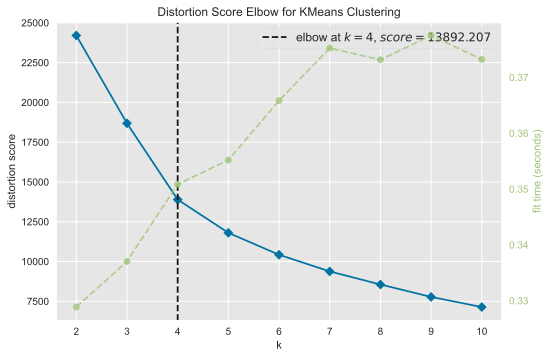

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [95]:
# Using the elbow method to find the optimal number of clusters'
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_df0_aw)
Elbow_M.show()

* The elbow method provides the optimum cluster number as 5 but from visual inspection both 4 and 5 clusters can work.

For n_clusters = 2, silhouette score is 0.3416774945902426
For n_clusters = 3, silhouette score is 0.367553737663301
For n_clusters = 4, silhouette score is 0.3684069062527851
For n_clusters = 5, silhouette score is 0.3540455907829294
For n_clusters = 6, silhouette score is 0.31790336022731847
For n_clusters = 7, silhouette score is 0.32844981065215284
For n_clusters = 8, silhouette score is 0.3324333633643183
For n_clusters = 9, silhouette score is 0.3211128203628425


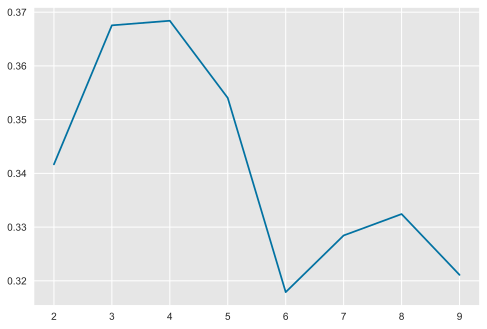

In [96]:
sil_score = []
cluster_list = list(range(2, 10))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((PCA_df0_aw))
    # centers = clusterer.cluster_centers_
    score = silhouette_score(PCA_df0_aw, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

plt.plot(cluster_list, sil_score)

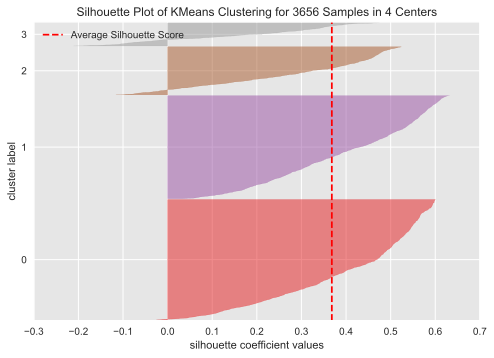

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 3656 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [97]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(PCA_df0_aw)
visualizer.show()

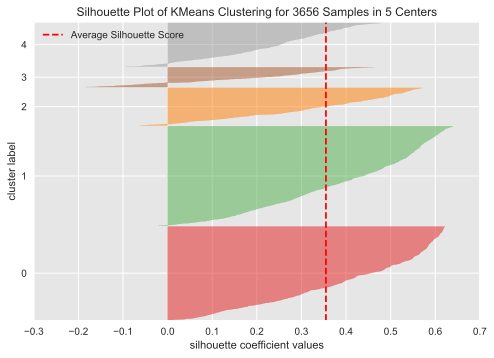

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 3656 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [98]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(PCA_df0_aw)
visualizer.show()

## 5. K-Means Model

In [99]:
df0_aw_std_act= df0_aw_std.copy()

In [100]:
df0_aw_std_act= df0_aw_std_act.drop(columns=['age','gender','height','weight'])

In [101]:
kmeans4_act = KMeans(n_clusters=4, random_state=42)
kmeans4_act.fit(df0_aw_std_act)

KMeans(n_clusters=4, random_state=42)

In [102]:
# adding kmeans cluster labels to the original dataframe
df_aw_clust=df0_aw.copy()
df_aw_clust["Kmeans4_act"] = kmeans4_act.labels_

In [103]:
df_aw_clust.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3656 entries, 0 to 3655
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   3656 non-null   int64  
 1   gender                3656 non-null   int64  
 2   height                3656 non-null   float64
 3   weight                3656 non-null   float64
 4   steps                 3656 non-null   float64
 5   hear_rate             3656 non-null   float64
 6   calories              3656 non-null   float64
 7   distance              3656 non-null   float64
 8   entropy_heart         3656 non-null   float64
 9   entropy_setps         3656 non-null   float64
 10  resting_heart         3656 non-null   float64
 11  corr_heart_steps      3656 non-null   float64
 12  norm_heart            3656 non-null   float64
 13  intensity_karvonen    3656 non-null   float64
 14  sd_norm_heart         3656 non-null   float64
 15  steps_times_distance 

In [104]:
df_aw_clust.head()

,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,activity,bmi,calories_bmi,Kmeans4_act
0,20,1,168.0,65.4,10.771429,78.531302,0.344533,0.008327,6.221612,6.116349,59.0,1.000000,19.531302,0.138520,1.000000,0.089692,0,23.171769,0.014869,3
1,20,1,168.0,65.4,11.475325,78.453390,3.287625,0.008896,6.221612,6.116349,59.0,1.000000,19.453390,0.137967,1.000000,0.102088,0,23.171769,0.141881,3
2,20,1,168.0,65.4,12.179221,78.540825,9.484000,0.009466,6.221612,6.116349,59.0,1.000000,19.540825,0.138587,1.000000,0.115287,0,23.171769,0.409291,1
3,20,1,168.0,65.4,12.883117,78.628260,10.154556,0.010035,6.221612,6.116349,59.0,1.000000,19.628260,0.139208,1.000000,0.129286,0,23.171769,0.438230,1
4,20,1,168.0,65.4,13.587013,78.715695,10.825111,0.010605,6.221612,6.116349,59.0,0.982816,19.715695,0.139828,0.241567,0.144088,0,23.171769,0.467168,1


In [105]:
df_aw_clust["Kmeans4_act"].value_counts()

3    1733
1    1116
2     563
0     244
Name: Kmeans4_act, dtype: int64

In [106]:
num_cols_act = ['steps', 'hear_rate', 'calories', 'distance', 'entropy_heart',
            'entropy_setps', 'resting_heart', 'corr_heart_steps', 'norm_heart',
            'intensity_karvonen', 'sd_norm_heart', 'steps_times_distance']

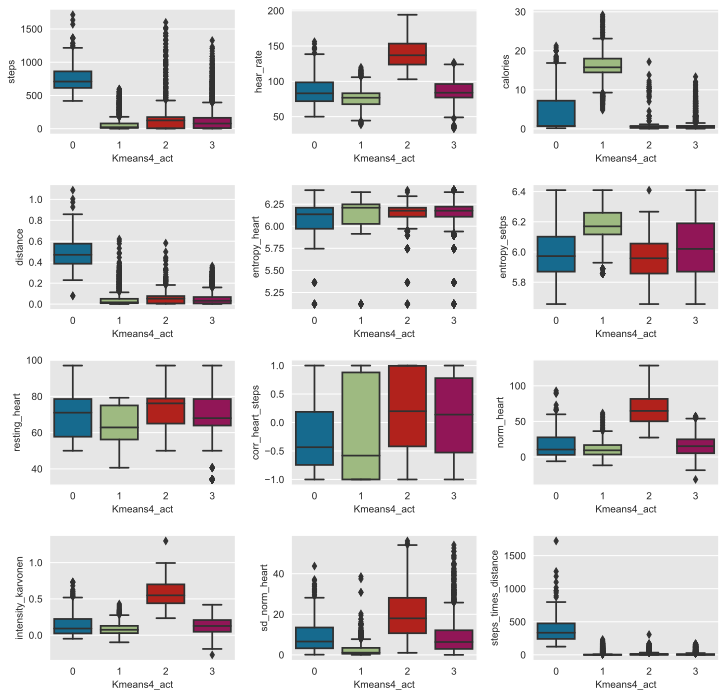

In [107]:
def boxplot():
        n_cols = len(num_cols_act)
        rows = n_cols // 3 
        _, axes = plt.subplots(ncols=3, nrows=rows, figsize=(12, 3 * rows))
        plt.subplots_adjust(wspace=0.3, hspace=0.4)
        for num, col in enumerate(num_cols_act):
            b = sns.boxplot(
                 data=df_aw_clust,
                 y=col,
                 x="Kmeans4_act",
                 #palette="$",
                 ax=axes.reshape(-1)[num])
            b.set_xlabel('Kmeans4_act', fontsize=10)
            b.set_ylabel(f'{df_aw_clust[col].name}', fontsize=10)
            sns.set_style('darkgrid')
            
boxplot()

<AxesSubplot:xlabel='Kmeans4_act', ylabel='count'>

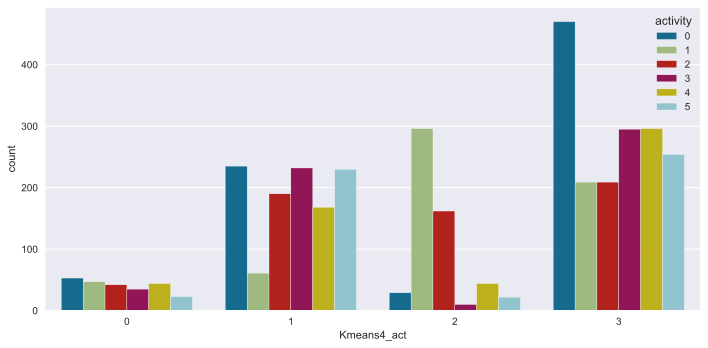

In [108]:
plt.rcParams["figure.figsize"] = [10, 5]
plt.rcParams["figure.autolayout"] = True

sns.countplot(df_aw_clust['Kmeans4_act'], hue = df_aw_clust["activity"] )


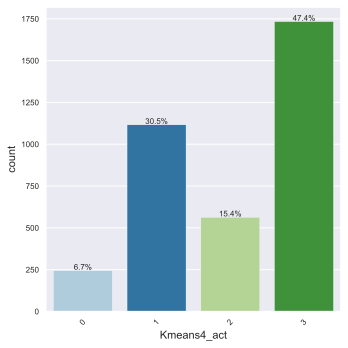

In [109]:
labeled_barplot(df_aw_clust, "Kmeans4_act", perc=True)

# Cluster Analysis Summary

#### Cluster 0
This cluster is characterized by an equal presence of all activity classes. However the uniqueness of this cluster is somehow due to their physiology. Their calories were low but heart rate moderate inspite of having covered more distance and steps compared to other clusters. This is also a very small population of data. 

* More steps taken and have travelled more distance compared to other clusters.
* Have spent less calories and moderate heart rate.
* Resting heart rate class has a median at 70.
* Intensity Karvonen median is low at 0.10.
* Steps times distance is higher compared to other clusters. 
* This cluster does not represent one single type of activity as dominant one. 

#### Cluster 1
This is a moderate intensiy work out class where all activity classes are overall similar except the high intensity MET 7 is the lowest.

* Fewer steps taken and less distance covered compared to other clusters.
* Calories and entropy_steps are higher compared to other clusters.
* Intensity Karvonen median is low at 0.08.
* Sd_norm_heart is lower than the others.
* This cluster comprises of physical activity dominated by lying, sitting, self-pace walking etc.. Running MET 7 is low.

#### Cluster 2
Dominated by high intensity workouts and characterizes high heart rate.

* Low steps and low distance.
* Heart rate is highest compared to other clusters and has a median at ~140.
* Have spent very less calories.
* Intensity Karvonen median is highest compared to other clusters at 0.60.
* This cluster dominated by running 7 METS and 5 METS.

#### Cluster 3
Dominated by the Lying activity besides having other physical activity classes.

* Low steps and low distance.
* Intensity Karvonen median is at 0.10.
* This cluster includes physical activity classes which is a mix of all kinds of activities. Lying is the highest compared to the other classes.


## EDA for Fitbit

In [110]:
df1_fb = df1[df1['device'] == 'fitbit'].copy()
df1_fb.reset_index(drop=True,inplace=True)

In [111]:
# Drop columns.
df1_fb= df1_fb.drop(columns=['Unnamed: 0', 'X1','device'])

In [112]:
df1_fb.shape

(2608, 19)

In [113]:
df1_fb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2608 entries, 0 to 2607
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   2608 non-null   int64  
 1   gender                2608 non-null   int64  
 2   height                2608 non-null   float64
 3   weight                2608 non-null   float64
 4   steps                 2608 non-null   float64
 5   hear_rate             2608 non-null   float64
 6   calories              2608 non-null   float64
 7   distance              2608 non-null   float64
 8   entropy_heart         2608 non-null   float64
 9   entropy_setps         2608 non-null   float64
 10  resting_heart         2608 non-null   float64
 11  corr_heart_steps      2608 non-null   float64
 12  norm_heart            2608 non-null   float64
 13  intensity_karvonen    2608 non-null   float64
 14  sd_norm_heart         2608 non-null   float64
 15  steps_times_distance 

array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'gender'}>,
        <AxesSubplot:title={'center':'height'}>,
        <AxesSubplot:title={'center':'weight'}>],
       [<AxesSubplot:title={'center':'steps'}>,
        <AxesSubplot:title={'center':'hear_rate'}>,
        <AxesSubplot:title={'center':'calories'}>,
        <AxesSubplot:title={'center':'distance'}>],
       [<AxesSubplot:title={'center':'entropy_heart'}>,
        <AxesSubplot:title={'center':'entropy_setps'}>,
        <AxesSubplot:title={'center':'resting_heart'}>,
        <AxesSubplot:title={'center':'corr_heart_steps'}>],
       [<AxesSubplot:title={'center':'norm_heart'}>,
        <AxesSubplot:title={'center':'intensity_karvonen'}>,
        <AxesSubplot:title={'center':'sd_norm_heart'}>,
        <AxesSubplot:title={'center':'steps_times_distance'}>],
       [<AxesSubplot:title={'center':'bmi'}>,
        <AxesSubplot:title={'center':'calories_bmi'}>, <AxesSubplot:>,
        <AxesSubplot:>]]

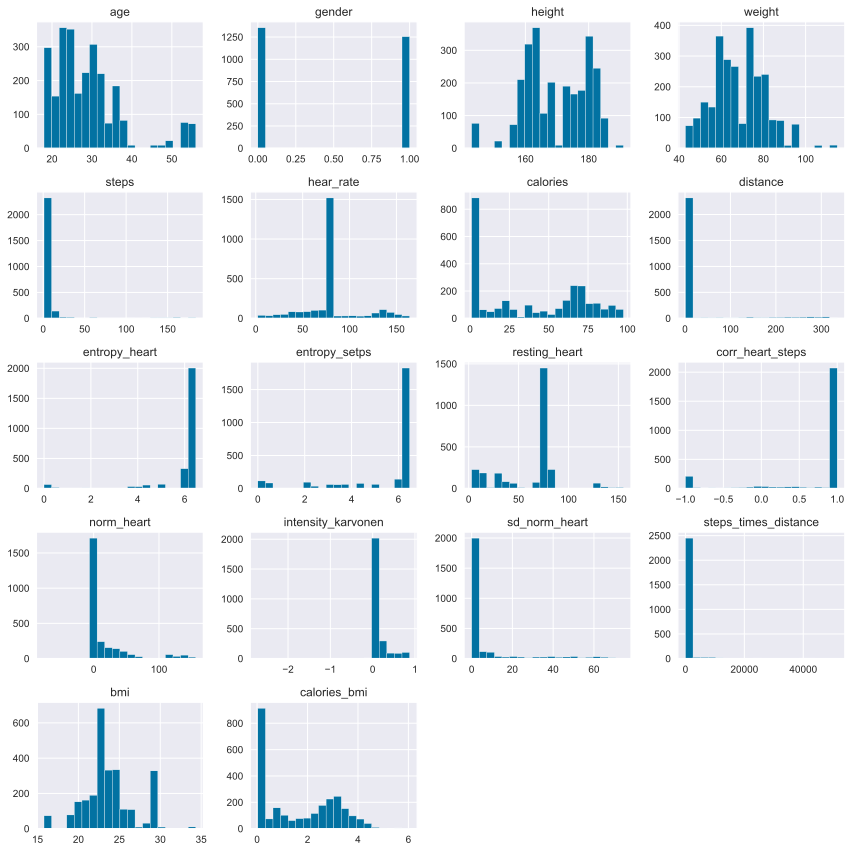

In [114]:
df1_fb.hist(bins=20, figsize=(12,12)) ## better plot with more scale like Fitbit & Apple watch

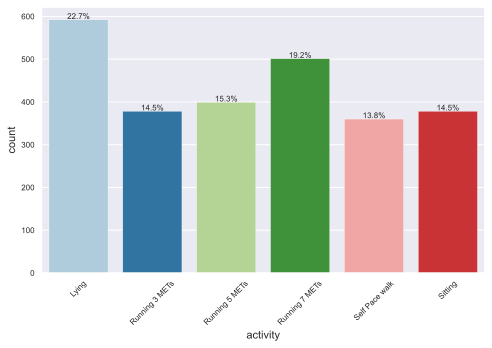

In [115]:
labeled_barplot(df1_fb, "activity", perc=True)

* Looks like there are some resting heart rate data which is below normal values.
* There is no negative data, although, some outliers are there which can be physiologically extreme.
* It would be recommended to build automated data correction in the wearables. 


<AxesSubplot:>

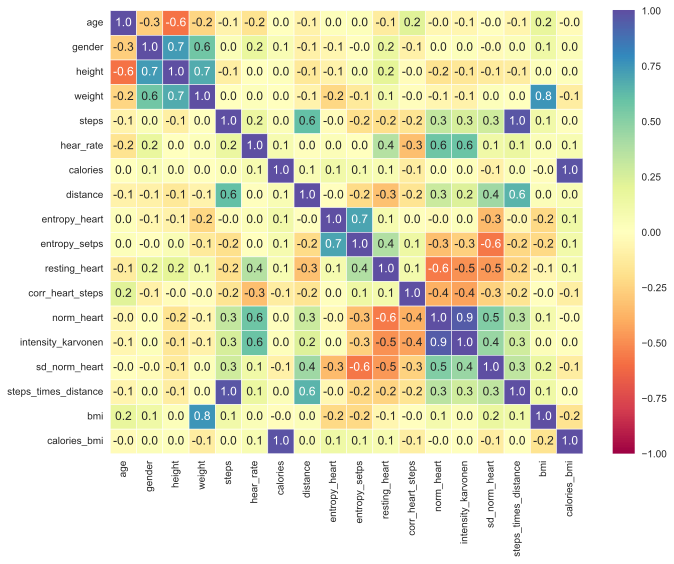

In [116]:
plt.figure(figsize = (10,8))
sns.heatmap(df1_fb.corr(),annot=True, center=0, linewidths=.5, fmt='.1f',vmin=-1, vmax=1, cmap="Spectral")

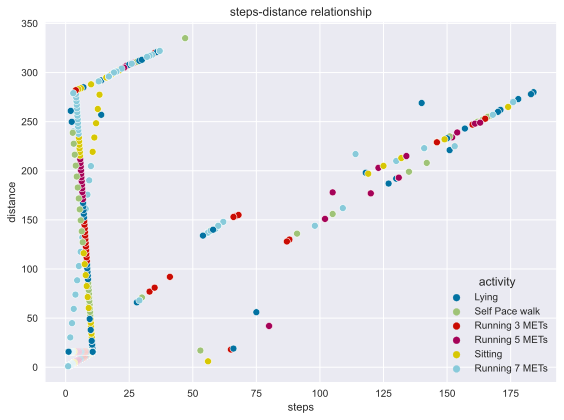

In [117]:
plt.figure(figsize = (8,6))
sns.scatterplot(data = df1_fb, x = 'steps', y = 'distance', hue='activity')
plt.title('steps-distance relationship');

* Distance and steps show a weaker correlation (0.6) on the Fitbit data compared to Apple Watch.
* Units on distance and steps are different between the 2 devices.

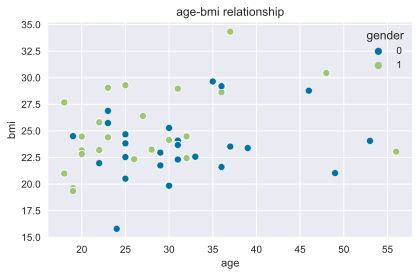

In [118]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_fb, x = 'age', y = 'bmi', hue='gender') # female=0
plt.title('age-bmi relationship');

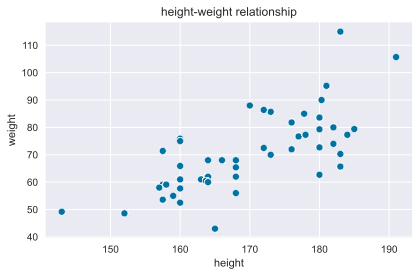

In [119]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_fb, x = 'height', y = 'weight')
plt.title('height-weight relationship');

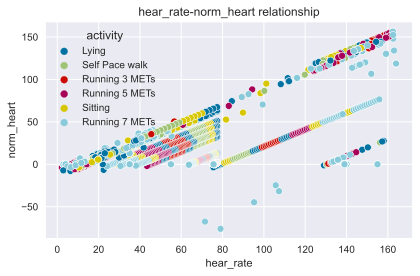

In [120]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_fb, x = 'hear_rate', y = 'norm_heart', hue='activity')
plt.title('hear_rate-norm_heart relationship');

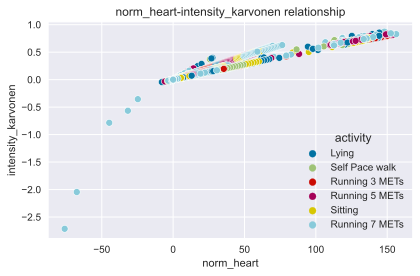

In [121]:
plt.figure(figsize = (6,4))
sns.scatterplot(data = df1_fb, x = 'norm_heart', y = 'intensity_karvonen', hue='activity')
plt.title('norm_heart-intensity_karvonen relationship');

* Since the users are the same, the age-bmi and height-weight relations are exactly same. 

* Intensity Kervonen correlates well with the physical activity types. There are some negative data. Since we do not know how these were calculated this data was not corrected. In addition we also wanted to check model performance based on the exact provided data. 



## Data preparation for modeling

In [122]:
df2_fb= df1_fb.copy()

In [123]:
df2_fb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2608 entries, 0 to 2607
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   2608 non-null   int64  
 1   gender                2608 non-null   int64  
 2   height                2608 non-null   float64
 3   weight                2608 non-null   float64
 4   steps                 2608 non-null   float64
 5   hear_rate             2608 non-null   float64
 6   calories              2608 non-null   float64
 7   distance              2608 non-null   float64
 8   entropy_heart         2608 non-null   float64
 9   entropy_setps         2608 non-null   float64
 10  resting_heart         2608 non-null   float64
 11  corr_heart_steps      2608 non-null   float64
 12  norm_heart            2608 non-null   float64
 13  intensity_karvonen    2608 non-null   float64
 14  sd_norm_heart         2608 non-null   float64
 15  steps_times_distance 

#### Now, first split the data into feature set and target (X,y)

In [124]:
# `y` is the target variable (what you are trying to predict)
fy = df2_fb['activity']

# `X` is the feature set that you are using to predict
fX = df2_fb.drop(['activity'],axis=1)  # keeping only independent features in the X matrix

In [125]:
print(f'There are {df2_fb.shape[0]} rows and {df2_fb.shape[1]} columns in the dataset df2_fb.')
print(f'There are {fX.shape[0]} rows and {fX.shape[1]} columns in the dataset fX, i.e., the independent variables.')


There are 2608 rows and 19 columns in the dataset df2_fb.
There are 2608 rows and 18 columns in the dataset fX, i.e., the independent variables.


###  Now lets split the data into train and test sets where 30% of the data resides in the test set.

In [126]:
fX_train, fX_test, fy_train, fy_test = train_test_split(fX, fy, test_size = 0.3, random_state = 42)

print(fX_train.shape, fX_test.shape)

(1825, 18) (783, 18)


In [127]:
# describes info about train and test set
print("fX_train dataset: ", fX_train.shape)
print("fy_train dataset: ", fy_train.shape)
print("fX_test dataset: ", fX_test.shape)
print("fy_test dataset: ", fy_test.shape)

fX_train dataset:  (1825, 18)
fy_train dataset:  (1825,)
fX_test dataset:  (783, 18)
fy_test dataset:  (783,)


In [128]:
# Lets check the target again
print(fy.value_counts())
print("")
print(fy.value_counts(1))

Lying             592
Running 7 METs    501
Running 5 METs    399
Running 3 METs    378
Sitting           378
Self Pace walk    360
Name: activity, dtype: int64

Lying             0.226994
Running 7 METs    0.192101
Running 5 METs    0.152991
Running 3 METs    0.144939
Sitting           0.144939
Self Pace walk    0.138037
Name: activity, dtype: float64


In [129]:
print(fy_test.value_counts())
fy_test.value_counts(1)

Lying             166
Running 7 METs    166
Running 5 METs    125
Sitting           124
Running 3 METs    108
Self Pace walk     94
Name: activity, dtype: int64


Lying             0.212005
Running 7 METs    0.212005
Running 5 METs    0.159642
Sitting           0.158365
Running 3 METs    0.137931
Self Pace walk    0.120051
Name: activity, dtype: float64

## Build Models

## 1.0b. Logistic Regression model

In [130]:
lr2 = LogisticRegression(multi_class='multinomial', solver='lbfgs')
lr2.fit(fX_train, fy_train)

print('accuracy score: %s' % lr2.score(fX_test, fy_test))
print('# of iterations %s' % lr2.n_iter_[0])

accuracy score: 0.37037037037037035
# of iterations 100


In [131]:
lr2.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'multinomial',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.4575    0.8216    0.5877       426
Running 3 METs     0.2602    0.1185    0.1628       270
Running 5 METs     0.2998    0.6971    0.4193       274
Running 7 METs     0.3529    0.3045    0.3269       335
Self Pace walk     0.2727    0.0113    0.0217       266
       Sitting     0.0000    0.0000    0.0000       254

      accuracy                         0.3715      1825
     macro avg     0.2739    0.3255    0.2531      1825
  weighted avg     0.2948    0.3715    0.2874      1825


Confusion Matrix:
[[350   9  19  48   0   0]
 [ 34  32 171  31   2   0]
 [ 34  20 191  25   4   0]
 [152  12  68 102   1   0]
 [ 29  44 153  37   3   0]
 [166   6  35  46   1   0]]

AxesSubplot(0.0268148,0.067037;0.375557x0.870556)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.3844    0.7711    0.5130       166
Running 

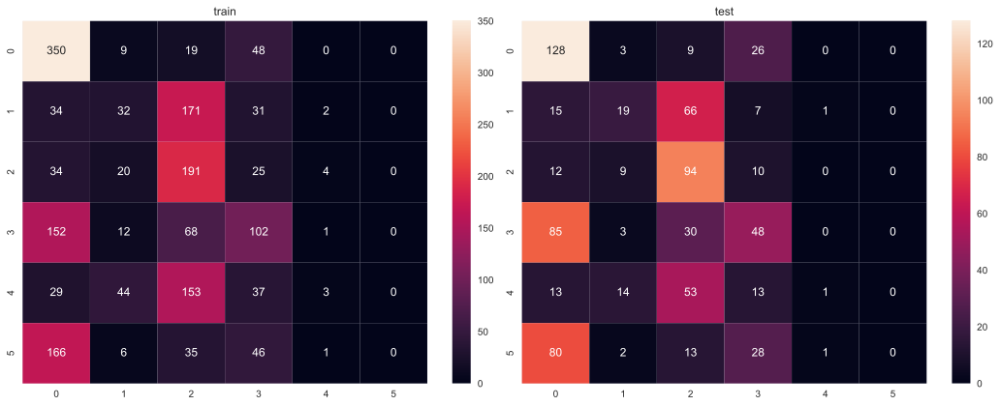

In [132]:
def print_score(lr2, fX_train, fy_train, fX_test, fy_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
fy_train_pred = lr2.predict(fX_train)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_train, fy_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_train, fy_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(fy_train, fy_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
fy_test_pred = lr2.predict(fX_test)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_test, fy_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_test, fy_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(fy_test, fy_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [133]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'lr2_report0'
lr2_report0=classification_report(fy_train, fy_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'lr2_train_perf'
lr2_train_perf={'accuracy': lr2_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=lr2_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
lr2_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_lr2_train_perf = pd.Series(lr2_train_perf)
print(s_lr2_train_perf)

accuracy        0.371507
precision       0.294840
recall          0.371507
f1-score        0.287409
support      1825.000000
dtype: float64


In [134]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'lr2_report'
lr2_report=classification_report(fy_test, fy_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'lr2_test_perf'
lr2_test_perf={'accuracy': lr2_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=lr2_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
lr2_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_lr2_test_perf = pd.Series(lr2_test_perf)
print(s_lr2_test_perf)

accuracy       0.370370
precision      0.307643
recall         0.370370
f1-score       0.289665
support      783.000000
dtype: float64


* Logistic regression is performing relatively poorly on the training and testing data.
* The Accuracy is low (~37%) so is the Recall and Precision.

## 2.0b Random Forest

In [135]:
rf2 = RandomForestClassifier(random_state = 42)
rf2.fit(fX_train, fy_train)

RandomForestClassifier(random_state=42)

In [136]:
rf2.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     1.0000    1.0000    1.0000       426
Running 3 METs     1.0000    1.0000    1.0000       270
Running 5 METs     1.0000    1.0000    1.0000       274
Running 7 METs     1.0000    1.0000    1.0000       335
Self Pace walk     1.0000    1.0000    1.0000       266
       Sitting     1.0000    1.0000    1.0000       254

      accuracy                         1.0000      1825
     macro avg     1.0000    1.0000    1.0000      1825
  weighted avg     1.0000    1.0000    1.0000      1825


Confusion Matrix:
[[426   0   0   0   0   0]
 [  0 270   0   0   0   0]
 [  0   0 274   0   0   0]
 [  0   0   0 335   0   0]
 [  0   0   0   0 266   0]
 [  0   0   0   0   0 254]]

AxesSubplot(0.0268148,0.067037;0.375557x0.870556)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8462    0.8614    0.8537       166
Running 

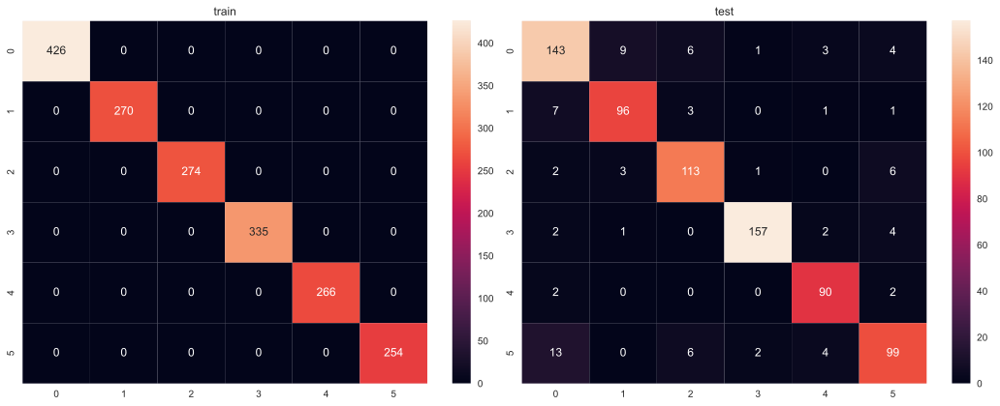

In [137]:
def print_score(rf2, fX_train, fy_train, fX_test, fy_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
fy_train_pred = rf2.predict(fX_train)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_train, fy_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_train, fy_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(fy_train, fy_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
fy_test_pred = rf2.predict(fX_test)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_test, fy_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_test, fy_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(fy_test, fy_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [138]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'rf2_report0'
rf2_report0=classification_report(fy_train, fy_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'rf2_train_perf'
rf2_train_perf={'accuracy': rf2_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=rf2_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
rf2_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_rf2_train_perf = pd.Series(rf2_train_perf)
print(s_rf2_train_perf)

accuracy        1.0
precision       1.0
recall          1.0
f1-score        1.0
support      1825.0
dtype: float64


In [139]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'rf2_report'
rf2_report=classification_report(fy_test, fy_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'rf2_test_perf'
rf2_test_perf={'accuracy': rf2_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=rf2_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
rf2_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_rf2_test_perf = pd.Series(rf2_test_perf)
print(s_rf2_test_perf)

accuracy       0.891443
precision      0.891744
recall         0.891443
f1-score       0.891257
support      783.000000
dtype: float64


* Random Forest is performing decently with high values along the diagonal, and high accuracy and precision.
* Training performance is 1 in all metrics while the testing performance is very good in 0.89 in all metrics.
* This indicates that the model is  overfitting the training data.

## 3.0b. KNN

In [140]:
knn2 = KNeighborsClassifier()
knn2.fit(fX_train, fy_train)

KNeighborsClassifier()

In [141]:
knn2.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8421    0.8263    0.8341       426
Running 3 METs     0.8746    0.9296    0.9013       270
Running 5 METs     0.8651    0.9124    0.8881       274
Running 7 METs     0.8525    0.8627    0.8576       335
Self Pace walk     0.8782    0.8947    0.8864       266
       Sitting     0.8371    0.7283    0.7789       254

      accuracy                         0.8575      1825
     macro avg     0.8583    0.8590    0.8577      1825
  weighted avg     0.8568    0.8575    0.8564      1825


Confusion Matrix:
[[352  15   5  22  17  15]
 [ 15 251   0   1   2   1]
 [ 10   7 250   5   1   1]
 [ 12   6  13 289   5  10]
 [  6   5   1   7 238   9]
 [ 23   3  20  15   8 185]]

AxesSubplot(0.0268148,0.067037;0.375557x0.870556)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.6867    0.6867    0.6867       166
Running 

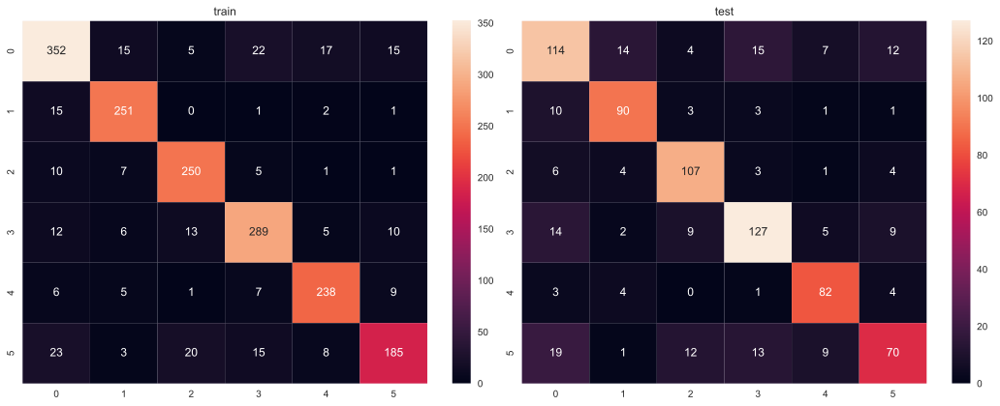

In [142]:
def print_score(knn2, fX_train, fy_train, fX_test, fy_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
fy_train_pred = knn2.predict(fX_train)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_train, fy_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_train, fy_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(fy_train, fy_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
fy_test_pred = knn2.predict(fX_test)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_test, fy_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_test, fy_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(fy_test, fy_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [143]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'knn2_report0'
knn2_report0=classification_report(fy_train, fy_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knn2_train_perf'
knn2_train_perf={'accuracy': knn2_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knn2_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knn2_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knn2_train_perf = pd.Series(knn2_train_perf)
print(s_knn2_train_perf)

accuracy        0.857534
precision       0.856831
recall          0.857534
f1-score        0.856404
support      1825.000000
dtype: float64


In [144]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'knn2_report'
knn2_report=classification_report(fy_test, fy_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knn2_test_perf'
knn2_test_perf={'accuracy': knn2_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knn2_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knn2_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knn2_test_perf = pd.Series(knn2_test_perf)
print(s_knn2_test_perf)

accuracy       0.753512
precision      0.750883
recall         0.753512
f1-score       0.750416
support      783.000000
dtype: float64


## 3.1b. Tuning KNN

In [145]:
knnt2=KNeighborsClassifier()

In [146]:
#List of Hyperparameters to be tested
leaf_size = list(range(10,50,5))
n_neighbors = list(range(3,15,1))
p=[1,2]

In [147]:
#Make it into a dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)

In [148]:
#cv is cross validation
clf = GridSearchCV(knnt2, hyperparameters, cv=10)

In [149]:
best_model2 = clf.fit(fX_train,  fy_train)

In [150]:
# best hyperpaameters values
print('Best leaf_size:', best_model2.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model2.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model2.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 10
Best p: 1
Best n_neighbors: 3


In [151]:
fy_test_pred = best_model2.predict(fX_test)

In [152]:
print(classification_report(fy_test, fy_test_pred))

                precision    recall  f1-score   support

         Lying       0.71      0.69      0.70       166
Running 3 METs       0.84      0.85      0.85       108
Running 5 METs       0.79      0.87      0.83       125
Running 7 METs       0.82      0.78      0.80       166
Self Pace walk       0.80      0.91      0.86        94
       Sitting       0.75      0.66      0.70       124

      accuracy                           0.78       783
     macro avg       0.79      0.80      0.79       783
  weighted avg       0.78      0.78      0.78       783



Confusion Matrix:
[[115  11   6  15  10   9]
 [ 10  92   2   2   1   1]
 [  9   3 109   1   1   2]
 [ 11   2  10 130   3  10]
 [  2   0   0   0  86   6]
 [ 14   1  11  10   6  82]]

AxesSubplot(0.0402222,0.0804444;0.753422x0.883556)





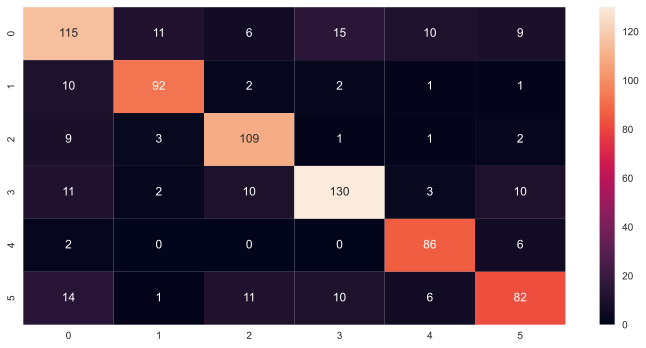

In [153]:
print(f'Confusion Matrix:\n{confusion_matrix(fy_test, fy_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(fy_test, fy_test_pred), annot=True, fmt="g"))

print('\n\n')


In [154]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'knnt2_report0'
knnt2_report0=classification_report(fy_train, fy_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knnt2_train_perf'
knnt2_train_perf={'accuracy': knnt2_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knnt2_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knnt2_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knnt2_train_perf = pd.Series(knnt2_train_perf)
print(s_knnt2_train_perf)

accuracy        0.857534
precision       0.856831
recall          0.857534
f1-score        0.856404
support      1825.000000
dtype: float64


In [155]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'knnt2_report'
knnt2_report=classification_report(fy_test, fy_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'knnt2_test_perf'
knnt2_test_perf={'accuracy': knnt2_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=knnt2_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
knnt2_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_knnt2_test_perf = pd.Series(knnt2_test_perf)
print(s_knnt2_test_perf)

accuracy       0.784163
precision      0.782924
recall         0.784163
f1-score       0.782248
support      783.000000
dtype: float64


* KNN is performing with 75% accuracy which is lower than Random Forest (89% accuracy).
* KNN is also slightly overfitting training data as the metrics show higher values for the Training performance.
* The metrics improved in the tuned KNN model where Leaf size, number of neighbors and p value ranges were tested through grid search CV. However, the tuned model is also overfitting the training data. Accuracy in tuned model improved to 78%.


## 4.0b. Gradient Boosting Classifier

In [156]:
#Fitting the model
gb2 = GradientBoostingClassifier(random_state=1)
gb2.fit(fX_train, fy_train)

GradientBoostingClassifier(random_state=1)

In [157]:
gb2.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 1,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.9952    0.9812    0.9882       426
Running 3 METs     0.9818    0.9963    0.9890       270
Running 5 METs     0.9963    0.9927    0.9945       274
Running 7 METs     1.0000    1.0000    1.0000       335
Self Pace walk     0.9925    1.0000    0.9963       266
       Sitting     0.9922    0.9961    0.9941       254

      accuracy                         0.9934      1825
     macro avg     0.9930    0.9944    0.9937      1825
  weighted avg     0.9935    0.9934    0.9934      1825


Confusion Matrix:
[[418   5   0   0   2   1]
 [  1 269   0   0   0   0]
 [  1   0 272   0   0   1]
 [  0   0   0 335   0   0]
 [  0   0   0   0 266   0]
 [  0   0   1   0   0 253]]

AxesSubplot(0.0268148,0.067037;0.375557x0.870556)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8623    0.8675    0.8649       166
Running 

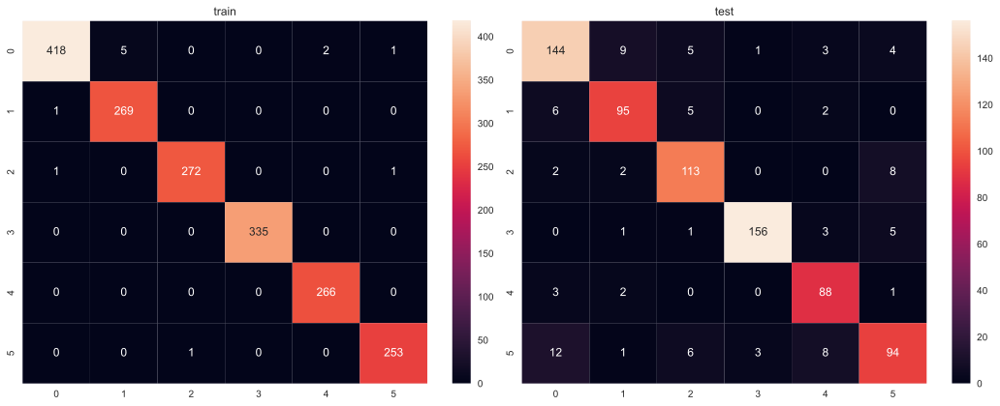

In [158]:
def print_score(gb2, fX_train, fy_train, fX_test, fy_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
fy_train_pred = gb2.predict(fX_train)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_train, fy_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_train, fy_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(fy_train, fy_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
fy_test_pred = gb2.predict(fX_test)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_test, fy_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_test, fy_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(fy_test, fy_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [159]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'gb2_report0'
gb2_report0=classification_report(fy_train, fy_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gb2_train_perf'
gb2_train_perf={'accuracy': gb2_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gb2_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gb2_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gb2_train_perf = pd.Series(gb2_train_perf)
print(s_gb2_train_perf)

accuracy        0.993425
precision       0.993459
recall          0.993425
f1-score        0.993419
support      1825.000000
dtype: float64


In [160]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'gb2_report'
gb2_report=classification_report(fy_test, fy_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gb2_test_perf'
gb2_test_perf={'accuracy': gb2_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gb2_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gb2_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gb2_test_perf = pd.Series(gb2_test_perf)
print(s_gb2_test_perf)

accuracy       0.881226
precision      0.881896
recall         0.881226
f1-score       0.880826
support      783.000000
dtype: float64


# 4.1b. Tuning Gradient Boosting

In [161]:
%%time

# defining model 
model2 = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV
param_grid2 = {"n_estimators": np.arange(50, 200), 
              "learning_rate": [0.3, 0.1, 0.075], 
              "max_depth":[10, 5, 3], 
              "max_features":['sqrt']}

#Calling RandomizedSearchCV
gbt2 = RandomizedSearchCV(estimator=model2, param_distributions=param_grid2, scoring='accuracy', cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
gbt2.fit(fX_train, fy_train)

print("Best parameters are {} with CV score={}:" .format(gbt2.best_params_, gbt2.best_score_))

Best parameters are {'n_estimators': 135, 'max_features': 'sqrt', 'max_depth': 5, 'learning_rate': 0.3} with CV score=0.9019178082191781:
CPU times: total: 3min 5s
Wall time: 3min 7s


In [162]:
gbt2 = GradientBoostingClassifier(
    random_state=1,
    n_estimators=135,
    max_features='sqrt',
    max_depth=5,
    learning_rate=0.3,
          
)
# Fit the model on training data
gbt2.fit(fX_train, fy_train)

GradientBoostingClassifier(learning_rate=0.3, max_depth=5, max_features='sqrt',
                           n_estimators=135, random_state=1)

TRAINING RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     1.0000    1.0000    1.0000       426
Running 3 METs     1.0000    1.0000    1.0000       270
Running 5 METs     1.0000    1.0000    1.0000       274
Running 7 METs     1.0000    1.0000    1.0000       335
Self Pace walk     1.0000    1.0000    1.0000       266
       Sitting     1.0000    1.0000    1.0000       254

      accuracy                         1.0000      1825
     macro avg     1.0000    1.0000    1.0000      1825
  weighted avg     1.0000    1.0000    1.0000      1825


Confusion Matrix:
[[426   0   0   0   0   0]
 [  0 270   0   0   0   0]
 [  0   0 274   0   0   0]
 [  0   0   0 335   0   0]
 [  0   0   0   0 266   0]
 [  0   0   0   0   0 254]]

AxesSubplot(0.0268148,0.067037;0.375557x0.870556)



TEST RESULTS:

Classification Report:
                precision    recall  f1-score   support

         Lying     0.8563    0.8614    0.8589       166
Running 

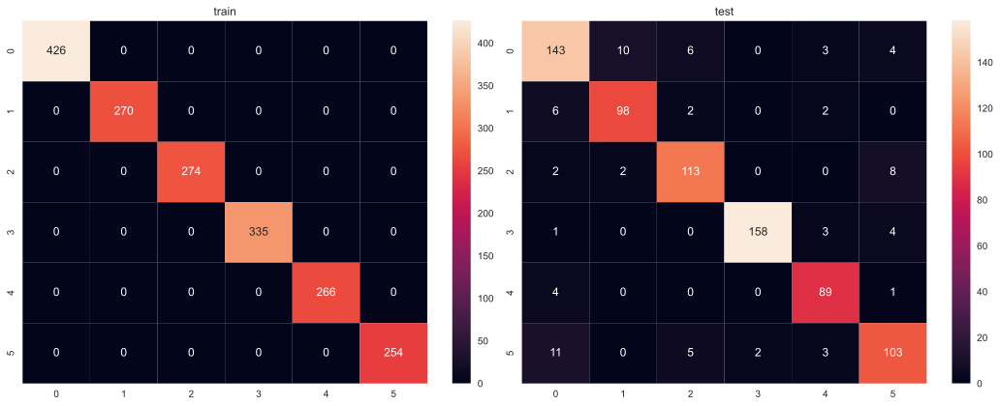

In [163]:
def print_score(gbt2, fX_train, fy_train, fX_test, fy_test):
    
# Training set
    
    print('\n\n')

print("TRAINING RESULTS:\n")

# Predict
fy_train_pred = gbt2.predict(fX_train)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_train, fy_train_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_train, fy_train_pred)}\n')
    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
ax[0].set_title("train")
ax[1].set_title("test")
    
print(sns.heatmap(confusion_matrix(fy_train, fy_train_pred), annot=True, fmt="g", ax=ax[0]))
    
print('\n\n')

# Test set

print("TEST RESULTS:\n")

# Predict
fy_test_pred = gbt2.predict(fX_test)

# Evaluation
print(f'Classification Report:\n{classification_report(fy_test, fy_test_pred, digits = 4)}\n')


print(f'Confusion Matrix:\n{confusion_matrix(fy_test, fy_test_pred)}\n')
    
print(sns.heatmap(confusion_matrix(fy_test, fy_test_pred), annot=True, fmt="g", ax=ax[1]))

print('\n\n')

In [164]:
#All codes together for train data

#Line 1 - Saving classification report as a dictionary, in 'gbt2_report0'
gbt2_report0=classification_report(fy_train, fy_train_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gbt2_train_perf'
gbt2_train_perf={'accuracy': gbt2_report0['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gbt2_report0['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gbt2_train_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gbt2_train_perf = pd.Series(gbt2_train_perf)
print(s_gbt2_train_perf)

accuracy        1.0
precision       1.0
recall          1.0
f1-score        1.0
support      1825.0
dtype: float64


In [165]:
#All codes together for test data

#Line 1 - Saving classification report as a dictionary, in 'gbt2_report'
gbt2_report=classification_report(fy_test, fy_test_pred, digits = 4, output_dict=True)

#Line 2- Saving the 'accuracy' data from the above dictionary into a new dictionary 'gbt2_test_perf'
gbt2_test_perf={'accuracy': gbt2_report['accuracy']}

#Line 3- Calling the weighted average data from line 1 as 'wtavg'
wtavg=gbt2_report['weighted avg']

#Line 4- add the 'wtavg' into the new dictionary created under Line 2
gbt2_test_perf.update(wtavg)

#Converting Dictionary to a Series so that we can do transform and concate later
s_gbt2_test_perf = pd.Series(gbt2_test_perf)
print(s_gbt2_test_perf)

accuracy       0.899106
precision      0.899723
recall         0.899106
f1-score       0.899189
support      783.000000
dtype: float64


* Gradient Boost (GB) model performing quite well on both train and test datasets.
* GB is slightly overfitting because training performance is better than the test performance.
* Tuned model shows perfect training performance and similar testing performance compared to previous gradient boost. Therefore, the tuned GB model is relatively overfitting  than the GB model.


# Model Performace Comparison and Conclusions

In [166]:
models_train_comp_df = pd.concat(
    [s_lr2_train_perf.T,
     s_rf2_train_perf.T,
     s_knn2_train_perf.T,
     s_knnt2_train_perf.T,
     s_gb2_train_perf.T, 
     s_gbt2_train_perf.T
    ],
    axis=1,
)  
models_train_comp_df.columns = [
    "Logistic Regression",
    "Random Forest",
    "KNN",
    "KNN Tuned",
    "Gradient Boost",
    "Gradient Boost Tuned",
    ]
models_train_comp_df= models_train_comp_df.drop(['support'])
print("Training performance comparison:")
models_train_comp_df   

Training performance comparison:


,Logistic Regression,Random Forest,KNN,KNN Tuned,Gradient Boost,Gradient Boost Tuned
accuracy,0.371507,1.0,0.857534,0.857534,0.993425,1.0
precision,0.294840,1.0,0.856831,0.856831,0.993459,1.0
recall,0.371507,1.0,0.857534,0.857534,0.993425,1.0
f1-score,0.287409,1.0,0.856404,0.856404,0.993419,1.0


In [167]:
models_test_comp_df = pd.concat(
    [s_lr2_test_perf.T,
     s_rf2_test_perf.T,
     s_knn2_test_perf.T,
     s_knnt2_test_perf.T,
     s_gb2_test_perf.T, 
     s_gbt2_test_perf.T
    ],
    axis=1,
)  
models_test_comp_df.columns = [
    "Logistic Regression",
    "Random Forest",
    "KNN",
    "KNN Tuned",
    "Gradient Boost",
    "Gradient Boost Tuned",
    ]
print("Testing performance comparison:")
models_test_comp_df   

Testing performance comparison:


,Logistic Regression,Random Forest,KNN,KNN Tuned,Gradient Boost,Gradient Boost Tuned
accuracy,0.370370,0.891443,0.753512,0.784163,0.881226,0.899106
precision,0.307643,0.891744,0.750883,0.782924,0.881896,0.899723
recall,0.370370,0.891443,0.753512,0.784163,0.881226,0.899106
f1-score,0.289665,0.891257,0.750416,0.782248,0.880826,0.899189
support,783.000000,783.000000,783.000000,783.000000,783.000000,783.000000


### Model selection:
* Performances were checked with various parameters:
     Reduced overfitting of training data over testing data
     Highest performance metrics, 
     and also the confusion matrices. 
* Highest emphasis was placed on the Recall as the identification of the certified cases (i.e., 1) is of prime importance.

**Random Forest and the Gradient Boost Tuned model  both show perfect training performances and very good testing performance compared to other models.** 

* Therefore, both Random Forest and Gradient Boost Tuned are appropriate for this application.
* It also shows that for this kind of application, the physical activity prediction on the Fitbit data is effective
* The accuracy of these two types of models are both close to 89%.

## Feature Importance

FEATURE IMPORTANCE OF RANDOM FOREST MODEL


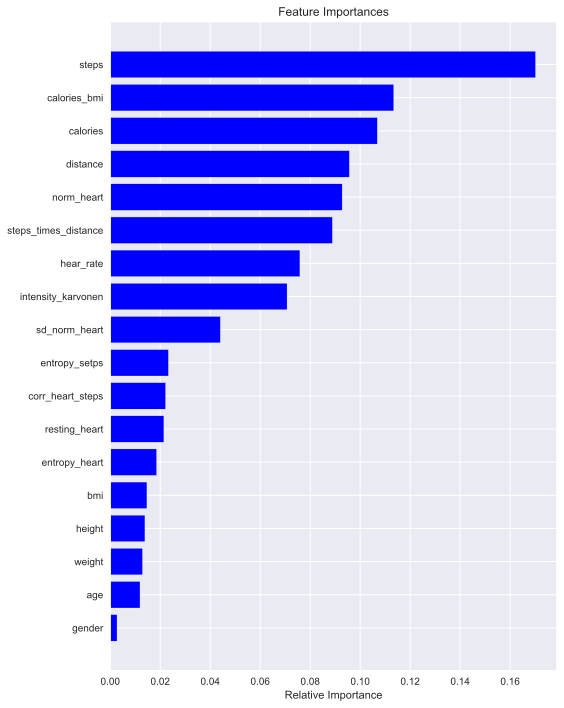

In [168]:
# For Random Forest

print('FEATURE IMPORTANCE OF RANDOM FOREST MODEL')

features = fX_train.columns
importances = rf2.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="Blue", align="center")
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

**Highest feature Importance are steps and calories.**

FEATURE IMPORTANCE OF GRADIENT BOOST TUNED MODEL


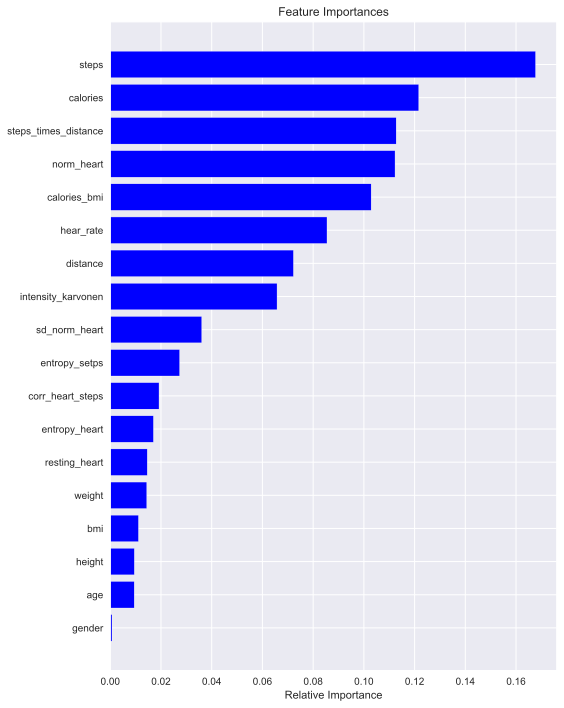

In [169]:
# For Gradient Boosting tuned

print('FEATURE IMPORTANCE OF GRADIENT BOOST TUNED MODEL')

features = fX_train.columns
importances = gbt2.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(8, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="Blue", align="center")
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

**Gradient Boosting also shows highest feature Importance as steps and calories.**

# Unsupervsed Learning

In [170]:
df0_fb = df2_fb.copy()

In [171]:
df0_fb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2608 entries, 0 to 2607
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   2608 non-null   int64  
 1   gender                2608 non-null   int64  
 2   height                2608 non-null   float64
 3   weight                2608 non-null   float64
 4   steps                 2608 non-null   float64
 5   hear_rate             2608 non-null   float64
 6   calories              2608 non-null   float64
 7   distance              2608 non-null   float64
 8   entropy_heart         2608 non-null   float64
 9   entropy_setps         2608 non-null   float64
 10  resting_heart         2608 non-null   float64
 11  corr_heart_steps      2608 non-null   float64
 12  norm_heart            2608 non-null   float64
 13  intensity_karvonen    2608 non-null   float64
 14  sd_norm_heart         2608 non-null   float64
 15  steps_times_distance 

In [172]:
# Encoded activity in numbers in order
df0_fb["activity"] = df0_fb["activity"].replace({"Lying": 0, "Running 7 METs": 1, "Running 5 METs": 2, "Running 3 METs": 3, "Sitting": 4, "Self Pace walk": 5})

In [173]:
#Scaling
scaler=StandardScaler()
scaler.fit(df0_fb)
df0_fb_std = pd.DataFrame(scaler.transform(df0_fb),columns= df0_fb.columns )
print("All features are now scaled")

All features are now scaled


## Applying PCA to the data

In [174]:
# PCA to reduce the dimensions of the data to 3 dimensions
pca = PCA(n_components = 3)
pca.fit(df0_fb_std)
PCA_df0_fb = pd.DataFrame(pca.transform(df0_fb_std), columns = (["PC1", "PC2", "PC3"]))
PCA_df0_fb.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,2608.0,-8.411812e-17,2.058946,-4.180606,-1.200365,-0.936454,0.450998,11.600082
PC2,2608.0,1.039685e-15,1.685784,-3.813804,-1.420868,0.391711,1.200072,6.375807
PC3,2608.0,-5.653283e-17,1.585601,-4.365143,-1.245951,-0.015205,1.123441,5.877983


### Cluster optimization

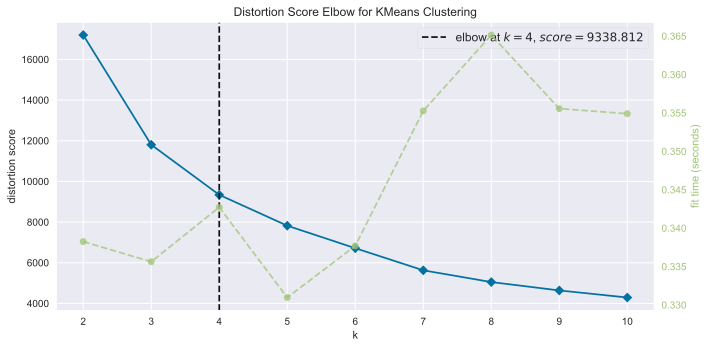

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [175]:
# Using the elbow method to find the optimal number of clusters'
Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_df0_fb)
Elbow_M.show()

* The elbow method provides the optimum cluster number as 4 but from visual inspection both 3 and 4 clusters can work.

For n_clusters = 2, silhouette score is 0.4867552455584086
For n_clusters = 3, silhouette score is 0.3704938582012879
For n_clusters = 4, silhouette score is 0.35727324456333603
For n_clusters = 5, silhouette score is 0.3586476795604585
For n_clusters = 6, silhouette score is 0.36558870081320566
For n_clusters = 7, silhouette score is 0.37728804409376626
For n_clusters = 8, silhouette score is 0.38405947401835133
For n_clusters = 9, silhouette score is 0.38138601442436176


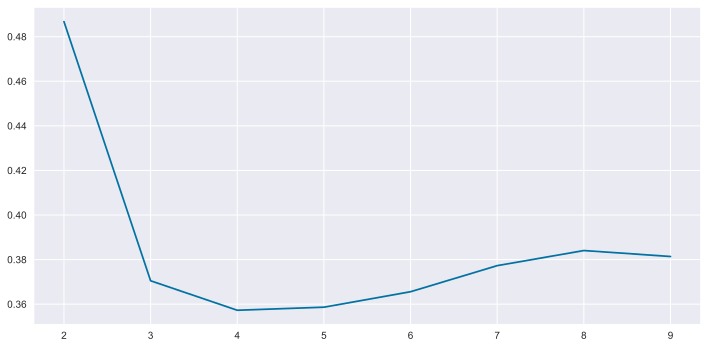

In [176]:
sil_score = []
cluster_list = list(range(2, 10))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((PCA_df0_fb))
    # centers = clusterer.cluster_centers_
    score = silhouette_score(PCA_df0_fb, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

plt.plot(cluster_list, sil_score)

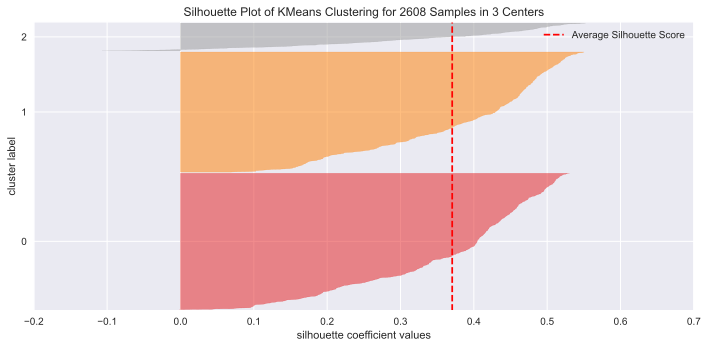

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 2608 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [177]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(PCA_df0_fb)
visualizer.show()

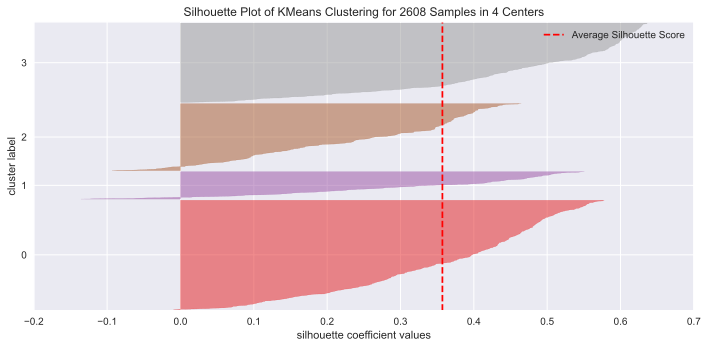

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 2608 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [178]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(PCA_df0_fb)
visualizer.show()

**Choosing to go for n=4 since Apple Watch had same clusters.**

## 5. K-Means Model

In [179]:
df0_fb_std_act= df0_fb_std.copy()

In [180]:
df0_fb_std_act= df0_fb_std_act.drop(columns=['age','gender','height','weight'])

In [181]:
kmeans4_act = KMeans(n_clusters=4, random_state=42)
kmeans4_act.fit(df0_fb_std_act)

KMeans(n_clusters=4, random_state=42)

In [182]:
# adding kmeans cluster labels to the original dataframe
df_fb_clust=df0_fb.copy()

df_fb_clust["Kmeans4_act"] = kmeans4_act.labels_

In [183]:
df_fb_clust.head()

,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,activity,bmi,calories_bmi,Kmeans4_act
0,20,1,168.0,65.4,1.0,132.000000,1.0,1.0,5.938588,2.179799,130.428571,1.000000,1.571429,0.022587,1.000000,1.0,0,23.171769,0.043156,2
1,20,1,168.0,65.4,1.0,132.777778,1.0,1.0,5.938588,2.179799,130.428571,1.000000,2.349206,0.033767,1.000000,1.0,0,23.171769,0.043156,2
2,20,1,168.0,65.4,1.0,129.888889,1.0,1.0,5.938588,2.179799,130.428571,1.000000,-0.539683,-0.007757,1.000000,1.0,0,23.171769,0.043156,2
3,20,1,168.0,65.4,1.0,129.142857,1.0,1.0,5.938588,2.179799,130.428571,1.000000,-1.285714,-0.018480,1.000000,1.0,0,23.171769,0.043156,2
4,20,1,168.0,65.4,1.0,134.555556,3.5,1.0,5.938588,2.179799,130.428571,-0.493589,4.126984,0.059320,1.368007,1.0,5,23.171769,0.151046,2


In [184]:
df_fb_clust["Kmeans4_act"].value_counts()

0    1083
2    1024
1     426
3      75
Name: Kmeans4_act, dtype: int64

In [185]:
num_cols_act2 = ['steps', 'hear_rate', 'calories', 'distance', 'entropy_heart',
            'entropy_setps', 'resting_heart', 'corr_heart_steps', 'norm_heart',
            'intensity_karvonen', 'sd_norm_heart', 'steps_times_distance']

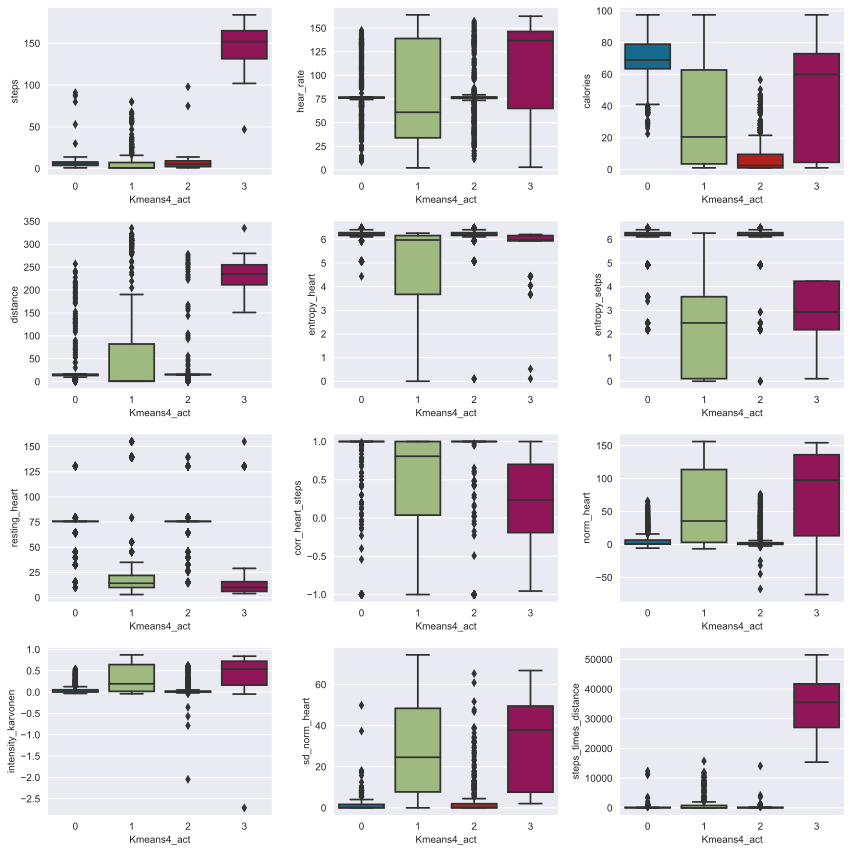

In [186]:
def boxplot():
        n_cols = len(num_cols_act2)
        rows = n_cols // 3 
        _, axes = plt.subplots(ncols=3, nrows=rows, figsize=(12, 3 * rows))
        plt.subplots_adjust(wspace=0.3, hspace=0.4)
        for num, col in enumerate(num_cols_act2):
            b = sns.boxplot(
                 data=df_fb_clust,
                 y=col,
                 x="Kmeans4_act",
                 #palette="$",
                 ax=axes.reshape(-1)[num])
            b.set_xlabel('Kmeans4_act', fontsize=10)
            b.set_ylabel(f'{df_fb_clust[col].name}', fontsize=10)
            sns.set_style('darkgrid')
            
boxplot()

<AxesSubplot:xlabel='Kmeans4_act', ylabel='count'>

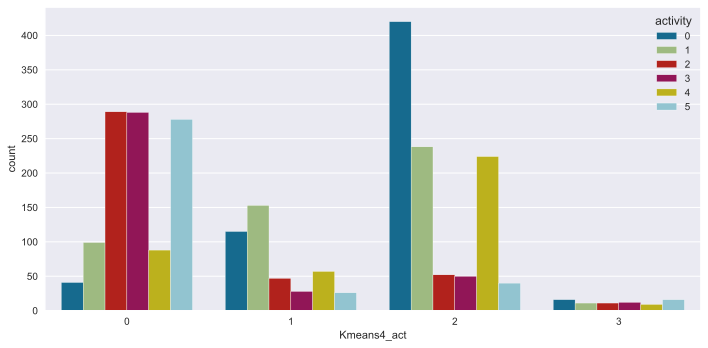

In [187]:
plt.rcParams["figure.figsize"] = [10, 5]
plt.rcParams["figure.autolayout"] = True

sns.countplot(df_fb_clust['Kmeans4_act'], hue = df_fb_clust["activity"] )

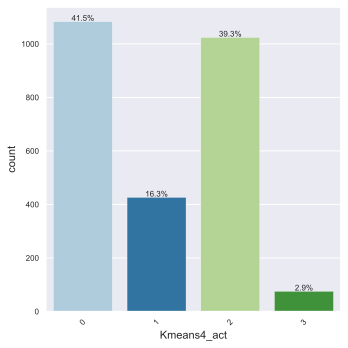

In [188]:
labeled_barplot(df_fb_clust, "Kmeans4_act", perc=True)

# Cluster Analysis Summary

#### Cluster 0
This cluster is mostly consisting of moderate intensity activity classes and is characterized by low steps, distance, and heart rates.

* Steps taken, distance, intensity_karvonen, sd_norm_heart, steps_times_distance is low.
* Calories is high.
* This cluster comprises mostly of running MET 5, MET 3 and self-pace walking. 
 

#### Cluster 1
This is the highest intensity cluster among all, although there is also considerable number of lying activity class included. This cluster is characterized by low steps, distance, and low calories.

* Fewer steps taken and less distance covered.
* Calories is low median at 20.
* Median entropy_steps is low compared to other clusters.
* This cluster comprises of running MET 7 as the highest activity followed by lying.


#### Cluster 2
Dominated by high lying activity and characterizes low steps, distance and less calories.

* Low steps and low distance.
* Have spent very less calories.
* Sd_norm_heart is low
* This cluster is dominated by Lying activity followed by running MET 7 and sitting.


#### Cluster 3
This cluster is characterized by an equal presence of all activity classes and the cluster population is small. Steps and distances is high compared to other clusters

* Steps and distance is high compared to other clusters
* Median of Heart_rate, norm_heart and sd_norm_heart is highest compared to other clusters.
* Steps_times_distance is high compared to other clusters
* This cluster includes physical activity classes which is a mix of all kinds of activities. The cluster population is small.



# Summary

* EDA shows the data includes Apple Watch and Fitbit users in comparable numbers, similarly physical activities are represented adequately. 
* The data does not specify what was exactly measured by the devices, derived from the devices and what was documented during the experiment. 
* Obesity and older age samples are missing.
* The target feature (activity) does not show strong correlation to individual measurements for e.g. heart rate, calories.  
* Therefore, ML is required to predict the physical activity classes. 
    * Logistic Regression, Random Forest, KNN, Random Forest and Gradient Boosting models were evaluated.
    * Hyperparameters were tuned for KNN and Gradient Boosting.
    * Random Forest and Gradient Boosting tuned performed better than the others with prediction accuracies of 84% for Apple Watch and 89% for Fitbit data.
    * Therefore, one needs to remember that 16% of the predictions were incorrect. 
    * Feature importance differed between Apple Watch and Fitbit data. Heart rate variables were important Apple Watch and steps and calories were important features for Fitbit.
    
Unsupervised Clustering were performed on the two datas to check if the clusters can predict the physical activity.

   * Running MET 7 activity makes the key difference likely due to the associated extreme measurements.
   * Apple watch measurements resulted in clustering that separated lying from running MET 7, whereas clustering of Fitbit measurement put them together.
   * Moderate activities were always clustered together.


# Business Insights and Recommendations

* The primary working principle of these devices is to collect instantaneous physiological measurements and use ML to predict physical activities. 
* The current measurements provided max accuracies of 84% for Apple Watch and 89% for Fitbit. Unless the embedded ML predictions uses a larger dataset the accuracy is not expected to be higher than this because the individual features do not show direct correlation to the physical activity classes.
* To avoid confusion in future the devices should clearly state what they measure and what they derive
* Future marketing should positively project the 84-89% accuracy
* Study should focus on how to improve the precision of prediction, one of the recommendation to do that is listed below.

The following recommendations can be implemented for the newer version of devices and future studies:

* The device needs to be trained on the individuals to improve accuracies of prediction.
* Include more features e.g., vigor of movement, blood oxygen level, blood sugar level, body temperature, some type of cumulative features over a time period e.g., calories expense and distance covered last 5 minutes.
* The training dataset needs to include more age groups, BMI, etc.
* For further marketing of the devices these accuracies needs to be taken into consideration to avoid any potential conflict.